In [1]:
suppressPackageStartupMessages({ 
    library(data.table) 
    library(dplyr) 
    library(ggplot2) 
    library(SingleCellExperiment)
    library(dplyr)
    library(celldex)
    library(SingleR)
    library(RColorBrewer)
    library(scater) 
    library(StabMap) 
    library(scran) 
    library(harmony) 
    library(patchwork)
    library(Seurat)
    library(plotly)
    library(pheatmap)
    library(batchelor)
    library(ggpubr)
    library(cowplot)
    library(viridis)
})

## List of Cell Types

In [2]:
#############################
######### MESODERM ##########
#############################

## list mesoderm posterior --> anterior along the primitive streak

Early_gastrula <- c("ExE ectoderm",
                    "Epiblast",
                    "Caudal epiblast",
                    "Primitive Streak",
                    "Nascent mesoderm",
                    "PGC")

yolksac_blood <- c("Haematoendothelial progenitors", 
                   "EMP", 
                   "MEP", 
                   "Megakaryocyte progenitors", 
                   "Blood progenitors", 
                   "Erythroid", 
                   "Chorioallantoic-derived erythroid progenitors")

endo <- c("YS endothelium",
          "Venous endothelium",
          "Embryo proper endothelium",
          "Allantois endothelium")
    
yolksac_other <- c("YS mesothelium-derived endothelial progenitors",
                   "YS mesothelium")

mesenchymal <- c("Embryo proper mesothelium",
                 "Mesenchyme")                   
                
allantois <- c("Allantois endothelium", 
               "Allantois")


In [3]:
#############################
######### MESODERM ##########
#############################

## list mesoderm posterior --> anterior along the primitive streak

Early_gastrula <- c("Primitive Streak",
                    "Nascent mesoderm",
                    "PGC")

yolksac_blood <- c("Haematoendothelial progenitors", 
                   "EMP", 
                   "MEP", 
                   "Megakaryocyte progenitors", 
                   "Blood progenitors", 
                   "Erythroid", 
                   "Chorioallantoic-derived erythroid progenitors")

endo <- c("YS endothelium",
          "Venous endothelium",
          "Embryo proper endothelium",
          "Allantois endothelium")
    
yolksac_other <- c("YS mesothelium-derived endothelial progenitors",
                   "YS mesothelium")

yolksac_other_2 <- c("YS mesothelium-derived endothelial progenitors"
                   #"YS mesothelium"
                     )

mesenchymal <- c("Embryo proper mesothelium",
                 "Mesenchyme")                   
                
allantois <- c("Allantois" 
               #"Allantois endothelium"
              )

ExE_mesoderm <- c(yolksac_blood, endo, yolksac_other, mesenchymal, allantois) 

Cranial_mesoderm <- c("Cranial mesoderm")

Cardiac_mesoderm <- c("Pharyngeal mesoderm",
                  "Cardiopharyngeal progenitors",
                  "Cardiopharyngeal progenitors SHF",
                  "Anterior cardiopharyngeal progenitors",
                  "Cardiopharyngeal progenitors FHF",
                  "Cardiomyocytes FHF 1",
                  "Cardiomyocytes FHF 2",
                  "Cardiomyocytes SHF 1",
                  "Cardiomyocytes SHF 2",
                  "Epicardium",
                  "Endocardium")

Lateral_plate_mesoderm <- c("Lateral plate mesoderm",
                           "Limb mesoderm",
                           "Forelimb")

Intermediate_mesoderm <- c("Intermediate mesoderm", "Kidney primordium")

Paraxial_mesoderm <- c("Paraxial mesoderm", 
                  "Presomitic mesoderm", 
                  "Somitic mesoderm",
                  "Anterior somitic tissues",
                  "Posterior somitic tissues",
                  "Dermomyotome", 
                  "Endotome", 
                  "Sclerotome")

Axial_mesoderm <- c("Caudal mesoderm", 
                  "NMPs", 
                  "NMPs/Mesoderm-biased",
                  "Node",
                  "Notochord")
                       
Frontonasal_mesenchyme <- c("Frontonasal mesenchyme")

mesoderm_list <- c(Early_gastrula,
                   ExE_mesoderm, 
                   Cranial_mesoderm, 
                   Cardiac_mesoderm, 
                   Lateral_plate_mesoderm, 
                   Intermediate_mesoderm, 
                   Paraxial_mesoderm, 
                   Axial_mesoderm,
                   Frontonasal_mesenchyme)

non_ExE_mesoderm_list <- c(Early_gastrula,
                   Cranial_mesoderm, 
                   Cardiac_mesoderm, 
                   Lateral_plate_mesoderm, 
                   Intermediate_mesoderm, 
                   Paraxial_mesoderm, 
                   Axial_mesoderm,
                   Frontonasal_mesenchyme)

cardiac_somitic_mesoderm_list <- c(Cranial_mesoderm, 
                   Cardiac_mesoderm, 
                   Lateral_plate_mesoderm, 
                   Intermediate_mesoderm, 
                   Paraxial_mesoderm, 
                   Axial_mesoderm,
                   Frontonasal_mesenchyme)

hemato_endo <- c(yolksac_blood, 
                   endo, 
                   yolksac_other_2, 
                   allantois)

In [4]:
str(mesoderm_list)

 chr [1:50] "Primitive Streak" "Nascent mesoderm" "PGC" ...


In [5]:
#############################
######### ECTODERM ##########
#############################

Surface_ectoderm <- c("Amniotic ectoderm",
                  "Surface ectoderm",
                  "Epidermis",
                  "Placodal ectoderm",
                  "Otic placode",
                  "Otic neural progenitors",
                  "Limb ectoderm")

# list A --> P + D --> V
Neural_tube <- c("Neural tube",
                "Optic vesicle",
                "Early dorsal forebrain progenitors",
                "Late dorsal forebrain progenitors",
                "Ventral forebrain progenitors",
                "Midbrain progenitors",
                "Dorsal midbrain neurons",
                "Midbrain/Hindbrain boundary",
                "Dorsal hindbrain progenitors", 
                "Hindbrain floor plate",
                "Hindbrain neural progenitors",
                "Ventral hindbrain progenitors",
                "Dorsal spinal cord progenitors",
                "Spinal cord progenitors")

Neural_crest <- c("Migratory neural crest",
                "Branchial arch neural crest")

extra_ectoderm <- c("Ectoderm", "Non-neural ectoderm")

ectoderm_list <- c(Surface_ectoderm, Neural_tube, Neural_crest, extra_ectoderm, "Epiblast", "Caudal epiblast")



In [6]:
#############################
######### ENDODERM ##########
#############################
## list endoderm early --> late, anterior --> posterior 

Primitive_endoderm <- c("Parietal endoderm", 
                     "ExE endoderm",
                     "Visceral endoderm")

Definitive_endoderm <- c("Anterior Primitive Streak",
                 "Gut tube",
                 "Foregut",
                 "Midgut",
                 "Hindgut",
                 "Pharyngeal endoderm",
                 "Thyroid primordium")

endoderm_list <- c(Definitive_endoderm, Primitive_endoderm)

In [7]:
str(ectoderm_list)

 chr [1:27] "Amniotic ectoderm" "Surface ectoderm" "Epidermis" ...


In [8]:
all_germlayer_list <- c(ectoderm_list, mesoderm_list, endoderm_list)

str(all_germlayer_list)

 chr [1:87] "Amniotic ectoderm" "Surface ectoderm" "Epidermis" ...


In [9]:
all_cells <- c("Allantois", "Allantois endothelium", "Amniotic ectoderm", "Anterior cardiopharyngeal progenitors",
               "Anterior Primitive Streak", "Anterior somitic tissues", "Blood progenitors",
               "Branchial arch neural crest", "Cardiomyocytes FHF 1", "Cardiomyocytes FHF 2", "Cardiomyocytes SHF 1",
               "Cardiomyocytes SHF 2", "Cardiopharyngeal progenitors", "Cardiopharyngeal progenitors FHF",
               "Cardiopharyngeal progenitors SHF", "Caudal epiblast", "Caudal mesoderm",
               "Chorioallantoic-derived erythroid progenitors", "Cranial mesoderm", "Dermomyotome",
               "Dorsal hindbrain progenitors", "Dorsal midbrain neurons", "Dorsal spinal cord progenitors",
               "Early dorsal forebrain progenitors", "Ectoderm", "Embryo proper endothelium",
               "Embryo proper mesothelium", "EMP", "Endocardium", "Endotome", "Epiblast", "Epicardium", "Epidermis",
               "Erythroid", "ExE ectoderm", "ExE endoderm", "Foregut", "Forelimb", "Frontonasal mesenchyme",
               "Gut tube", "Haematoendothelial progenitors", "Hindbrain floor plate", "Hindbrain neural progenitors",
               "Hindgut", "Intermediate mesoderm", "Kidney primordium", "Late dorsal forebrain progenitors",
               "Lateral plate mesoderm", "Limb ectoderm", "Limb mesoderm", "Megakaryocyte progenitors", "MEP",
               "Mesenchyme", "Midbrain progenitors", "Midbrain/Hindbrain boundary", "Midgut", "Migratory neural crest",
               "Nascent mesoderm", "Neural tube", "NMPs", "NMPs/Mesoderm-biased", "Node", "Non-neural ectoderm",
               "Notochord", "Optic vesicle", "Otic neural progenitors", "Otic placode", "Paraxial mesoderm",
               "Parietal endoderm", "PGC", "Pharyngeal endoderm", "Pharyngeal mesoderm", "Placodal ectoderm",
               "Posterior somitic tissues", "Presomitic mesoderm", "Primitive Streak", "Sclerotome", "Somitic mesoderm",
               "Spinal cord progenitors", "Surface ectoderm", "Thyroid primordium", "Venous endothelium",
               "Ventral forebrain progenitors", "Ventral hindbrain progenitors", "Visceral endoderm",
               "YS endothelium", "YS mesothelium", "YS mesothelium-derived endothelial progenitors")

In [10]:
str(all_cells)

 chr [1:88] "Allantois" "Allantois endothelium" "Amniotic ectoderm" ...


In [11]:
# Split the character vector into four smaller vectors
split_size <- 22
char_vector_1 <- all_cells[1:split_size]
char_vector_2 <- all_cells[(split_size + 1):(2 * split_size)]
char_vector_3 <- all_cells[(2 * split_size + 1):(3 * split_size)]
char_vector_4 <- all_cells[(3 * split_size + 1):length(all_cells)]

# Print the smaller vectors
print(char_vector_1)
print(char_vector_2)
print(char_vector_3)
print(char_vector_4)

 [1] "Allantois"                                    
 [2] "Allantois endothelium"                        
 [3] "Amniotic ectoderm"                            
 [4] "Anterior cardiopharyngeal progenitors"        
 [5] "Anterior Primitive Streak"                    
 [6] "Anterior somitic tissues"                     
 [7] "Blood progenitors"                            
 [8] "Branchial arch neural crest"                  
 [9] "Cardiomyocytes FHF 1"                         
[10] "Cardiomyocytes FHF 2"                         
[11] "Cardiomyocytes SHF 1"                         
[12] "Cardiomyocytes SHF 2"                         
[13] "Cardiopharyngeal progenitors"                 
[14] "Cardiopharyngeal progenitors FHF"             
[15] "Cardiopharyngeal progenitors SHF"             
[16] "Caudal epiblast"                              
[17] "Caudal mesoderm"                              
[18] "Chorioallantoic-derived erythroid progenitors"
[19] "Cranial mesoderm"                       

In [12]:
not_in_both <- setdiff(unique(c(all_cells, all_germlayer_list)), intersect(all_cells, all_germlayer_list))

# Display the names that do not appear in both lists
print(not_in_both)

[1] "ExE ectoderm"


## Celltype Colours

In [13]:
embryo_colors <- c(
  "embryo_1" = "#1f78b4",  # shades of blue
  "embryo_2" = "#a6cee3",  # shades of blue
  "embryo_3" = "#33a02c",  # shades of green
  "embryo_4" = "#b2df8a",  # shades of green
  "embryo_5" = "#ff7f00",  # shades of orange
  "embryo_6" = "#fdbf6f",  # shades of orange
  "embryo_7" = "#ffcc00"   # shades of orange
)


In [14]:
post_QC_cluster_colors_E6_E7 <- c(
  "failed_qc" = "#CCCCCC",
  "0" = "#7FC97F",   # Green
  "1" = "#BEAED4",   # Purple
  "2" = "#FDC086",   # Orange
  "3" = "#FFFF99",   # Yellow
  "4" = "#386CB0",   # Blue
  "5" = "#F0027F",   # Red
  "6" = "#ADD8E6",   # Light blue (adjusted)
  "7" = "#444444",   # Dark grey (adjusted)
  "8" = "#FFC0CB",   # Pale pink (adjusted)
  "9" = "#D95F02",   # Dark orange
  "10" = "#7570B3",  # Dark purple
  "11" = "#800000",  # Maroon (adjusted)
  "12" = "#66A61E",  # Dark green
  "13" = "#E6AB02",  # Dark yellow
  "14" = "#FF7F00",  # Orange
  "15" = "#6A3D9A"   # Dark purple (adjusted)
)


In [15]:
post_QC_cluster_colors_E8 <- c(
  "failed_qc" = "#CCCCCC",
  "0" = "#7FC97F",    # Green
  "1" = "#BEAED4",    # Purple
  "2" = "#FDC086",    # Orange
  "3" = "#FFFF99",    # Yellow
  "4" = "#386CB0",    # Blue
  "5" = "#F0027F",    # Red
  "6" = "#ADD8E6",    # Light blue
  "7" = "#444444",    # Dark grey
  "8" = "#FFC0CB",    # Pale pink
  "9" = "#D95F02",    # Dark orange
  "10" = "#7570B3",   # Dark purple
  "11" = "#800000",   # Maroon
  "12" = "#66A61E",   # Dark green
  "13" = "#E6AB02",   # Dark yellow
  "14" = "#FF7F00",   # Orange
  "15" = "#6A3D9A",   # Dark purple
  "16" = "#1F78B4",   # Medium blue
  "17" = "#33A02C",   # Green (adjusted)
  "18" = "#FB9A99",   # Light red
  "19" = "#E31A1C",   # Red (adjusted)
  "20" = "#FDBF6F",   # Light orange
  "21" = "#CAB2D6",   # Lavender
  "22" = "#B2DF8A",   # Light green (adjusted)
  "23" = "#B15928",   # Brown
  "24" = "#FBB4AE",   # Light pink
  "25" = "#FFD92F",   # Yellow (adjusted)
  "26" = "#A6CEE3",   # Light blue (adjusted)
  "27" = "#F0E442",   # Yellow (adjusted)
  "28" = "#FFEDA0",   # Light orange (adjusted)
  "29" = "#1B9E77",   # Dark green (adjusted)
  "30" = "#FD8D3C",   # Dark orange (adjusted)
  "31" = "#800080",   # Purple (adjusted)
  "32" = "#000000"    # Black
)

In [16]:
post_QC_celltype_colours <- c(
  "failed_qc" = "#CCCCCC",
  "rostral epiblast" = "#FFA07A",   # Light Salmon
  "ExE mesoderm" = "#8A2BE2",   # Blue Violet
  "primitive streak" = "#FF6347",   # Tomato
  "distal ExE ectoderm #1" = "#FFD700",   # Gold
  "visceral endoderm #1" = "#00BFFF",   # Deep Sky Blue
  "caudal epiblast" = "#FF4500",   # Orange Red
  "epiblast" = "#87CEEB",   # Sky Blue
  "proximal ExE ectoderm #2" = "#A9A9A9",   # Dark Gray
  "proximal ExE ectoderm #1" = "#FF69B4",   # Hot Pink
  "distal ExE ectoderm #2" = "#FF8C00",   # Dark Orange
  "ExE endoderm" = "#9400D3",  # Dark Violet
  "visceral endoderm #2" = "#800000",  # Maroon
  "haematoendothelial" = "#556B2F",  # Dark Olive Green
  "definitive endoderm" = "#8B4513",  # Saddle Brown
  "ExE ectoderm #3" = "#FF4500",  # Orange Red
  "mesodermal wings" = "#9932CC",   # Dark Orchid
  "endothelium #1" = "#3CB371",    # Medium Sea Green
  "spinal cord" = "#9400D3",    # Dark Violet
  "blood" = "#FF6347",    # Tomato
  "anterior somitic tissue" = "#FFD700",    # Gold
  "lateral plate mesoderm" = "#4169E1",    # Royal Blue
  "brain #1" = "#FF0000",    # Red
  "posterior somitic tissue" = "#87CEEB",    # Sky Blue
  "brain #2" = "#A9A9A9",    # Dark Grey
  "brain #3" = "#FF69B4",    # Hot Pink
  "cardiomyocytes" = "#FF8C00",    # Dark Orange
  "posterior somatic LP mesoderm #2" = "#8A2BE2",   # Blue Violet
  "hindgut" = "#800000",   # Maroon
  "midgut" = "#556B2F",   # Dark Olive Green
  "neural crest #1" = "#8B4513",   # Saddle Brown
  "mesenchyme" = "#FF6347",   # Tomato
  "paraxial mesoderm" = "#9932CC",   # Dark Orchid
  "surface ectoderm #1" = "#4169E1",   # Royal Blue
  "presomitic mesoderm" = "#3CB371",   # Medium Sea Green
  "surface ectoderm #2" = "#FF69B4",   # Hot Pink
  "neural crest #2" = "#FF0000",   # Red
  "brain #6" = "#FFD700",   # Gold
  "posterior somatic LP mesoderm #1" = "#E6E6FA",   # Lavender
  "dorsal foregut" = "#32CD32",   # Lime Green
  "splanchnic LP mesoderm #1" = "#8B4513",   # Saddle Brown
  "splanchnic LP mesoderm #2" = "#FFB6C1",   # Light Pink
  "allantois" = "#FFD700",   # Gold
  "ventral foregut" = "#87CEEB",   # Sky Blue
  "brain #5" = "#FFD700",   # Gold
  "endothelium #2" = "#FFA500",   # Orange
  "neural crest #3" = "#556B2F",   # Dark Olive Green
  "brain #4" = "#FF8C00",   # Dark Orange
  "otic placode" = "#800080",   # Purple
  "macrophage" = "#808080"    # Gray
)


In [17]:
seurat_colors <- c(
 "failed_qc" = "#CCCCCC",
 "0" = "#FACB12",
  "1" = "#DABE99",
  "2" = "#9e6762",
  "3" = "#635547",
  "4" = "#c19f70",
  "5" = "#F397C0",
  "6" = "#ff00b2",
  "7" = "#ffb7ff",
  "8" = "#95e1ff",
  "9" = "#97bad3",
  "10" = "#C594BF",
  "11" = "#139992",
  "12" = "#3F84AA",
  "13" = "#F9DFE6",
  "14" = "#e35f82",
  "15" = "#d02d75",
  "16" = "#e85639",
  "17" = "#5581ca",
  "18" = "#005579",
  "19" = "#5adbe4",
  "20" = "#8DB5CE",
  "21" = "#456722",
  "22" = "#d5e839",
  "23" = "#e3cb3a",
  "24" = "#00BFC4",
  "25" = "#C9EBFB",
  "26" = "#556789",
  "27" = "#683ed8",
  "28" = "#532C8A",
  "29" = "#cc7818",
  "30" = "#ff7f9c",
  "31" = "#f79083",
  "32" = "#ff487d",
  "33" = "#d780b0",
  "34" = "#a64d7e",
  "35" = "#B51D8D",
  "36" = "#4b7193",
  "37" = "#5d70dc",
  "38" = "#332c6c",
  "39" = "#FBBE92",
  "40" = "#6c4b4c",
  "41" = "#4b7193",
  "42" = "#5d70dc",
  "43" = "#332c6c",
  "44" = "#FBBE92",
  "45" = "#6c4b4c",
  "46" = "#C72228",
  "47" = "#E50000",
  "48" = "#e3cb3a",
  "49" = "#EF4E22",
  "50" = "#7c2a47",
  "51" = "#ff891c",
  "52" = "#AE3F3F",
  "53" = "#2f4a60",
  "54" = "#90e3bf",
  "55" = "#bd3400",
  "56" = "#9d0049",
  "57" = "#89c1f5",
  "58" = "#8EC792",
  "59" = "#ff675c",
  "60" = "#bd7300",
  "61" = "#a0b689",
  "62" = "#0f8073",
  "63" = "#7a9941",
  "64" = "#8ab3b5",
  "65" = "#9bf981",
  "66" = "#12ed4c",
  "67" = "#7e907a",
  "68" = "#2c6521",
  "69" = "#bf9da8",
  "70" = "#59b545",
  "71" = "#233629",
  "72" = "#4a6798",
  "73" = "#bd84b0",
  "74" = "#d3b1b1",
  "75" = "#6b2035",
  "76" = "#e273d6",
  "77" = "#f7f79e",
  "78" = "#fcff00",
  "79" = "#fff335",
  "80" = "#ffd731",
  "81" = "#dbb400",
  "82" = "#ff5c00",
  "83" = "#f1a262",
  "84" = "#00b000",
  "85" = "#F6BFCB",
  "86" = "#7F6874",
  "87" = "#989898",
  "88" = "#1A1A1A"
)

In [18]:
stages_colors = c(
"E6.5" = "#F21A00",
"E6.75" = "#EC4B00",
"E7.0" = "#E67D00",
"E7.25" = "#E1AF00",
"E7.5" = "#E4B80E",
"E7.75"="#E7C21C",
"E8.0" = "#EBCC2A",
"E8.25" = "#C4C55D",
"E8.5" = "#9EBE91",
"E8.75" = "#78B7C5",
"E9.0" = "#3399FF",
"E9.25"="#297ACC",
"E9.5"="#2162A3",
"Mixed gastrulation" = "#BEBEBE")

In [19]:
anatomy_colors = c(
"EP" = "#000000",
"YS" = "#5E4FA2",
"Anterior section" = "#774611",
"Posterior section" = "#A2D630",
"Medial section" = "#D95F02",
"Posterior"="#E2C207",
"Anterior" = "#F71616",
"Pooled" = "#BEBEBE",
"NA" = "#BEBEBE")

In [20]:
original.colors = c(
  "Epiblast" = "#635547",
  "Primitive Streak" = "#DABE99",
  "Anterior Primitive Streak" = "#c19f70",
  "Caudal epiblast" = "#9e6762",
  "PGC" = "#FACB12",
  "Anterior Primitive_Streak" = "#c19f70",
  "Notochord" = "#0F4A9C",
  "Def. endoderm" = "#F397C0",
  "Gut" = "#EF5A9D",
  "Nascent mesoderm" = "#C594BF",
  "Mixed mesoderm" = "#DFCDE4",
  "Intermediate mesoderm" = "#139992",
  "Caudal Mesoderm" = "#3F84AA",
  "Paraxial mesoderm" = "#8DB5CE",
  "Somitic mesoderm" = "#005579",
  "Pharyngeal mesoderm" = "#C9EBFB",
  "Cardiomyocytes" = "#B51D8D",
  "Allantois" = "#532C8A",
  "ExE mesoderm" = "#8870ad",
  "Mesenchyme" = "#cc7818",
  "Haematoendothelial progenitors" = "#FBBE92",
  "Endothelium" = "#ff891c",
  "Blood progenitors" = "#c9a997",
  "Blood progenitors 1" = "#f9decf",
  "Blood progenitors 2" = "#c9a997",
  "Erythroid" = "#EF4E22",
  "Erythroid1" = "#C72228",
  "Erythroid2" = "#f79083",
  "Erythroid3" = "#EF4E22",
  "NMP" = "#8EC792",
  "Neurectoderm" = "#65A83E",
  "Rostral neurectoderm" = "#65A83E",
  "Caudal neurectoderm" = "#354E23",
  "Neural crest" = "#C3C388",
  "Forebrain Midbrain_Hindbrain" = "#647a4f",
  "Spinal cord" = "#CDE088",
  "Surface ectoderm" = "#f7f79e",
  "Visceral endoderm" = "#F6BFCB",
  "ExE endoderm" = "#7F6874",
  "ExE ectoderm" = "#989898",
  "Parietal endoderm" = "#1A1A1A"
)

In [21]:
extended.colors = c(
"Epiblast" = "#635547",
"Epiblast_0" = "#635547",
"Epiblast_1" = "#FACB12",
"Primitive Streak" = "#DABE99",
"Caudal epiblast" = "#9e6762",
"PGC" = "#FACB12",
"Anterior Primitive Streak" = "#c19f70",
"Node"="#153b3d",
"Notochord" = "#0F4A9C",
"Gut tube" = "#EF5A9D",
"Hindgut" = "#F397C0",
"Midgut" = "#ff00b2",
"Foregut" = "#ffb7ff",
"Pharyngeal endoderm"="#95e1ff",
"Thyroid primordium"="#97bad3",
"Nascent mesoderm" = "#C594BF",
"Intermediate mesoderm" = "#139992",
"Caudal mesoderm" = "#3F84AA",
"Lateral plate mesoderm" = "#F9DFE6",
"Limb mesoderm" = "#e35f82",
"Forelimb" = "#d02d75",
"Kidney primordium" = "#e85639",
"Presomitic mesoderm"="#5581ca",#"#0000ff",#blue
"Somitic mesoderm" = "#005579",
"Posterior somitic tissues" = "#5adbe4",#"#40e0d0",#turquoise
"Paraxial mesoderm" = "#8DB5CE",
"Cranial mesoderm" = "#456722",#"#006400",#darkgreen
"Anterior somitic tissues"= "#d5e839",
"Sclerotome" = "#e3cb3a",#"#ffff00",#yellow
"Dermomyotome" = "#00BFC4",#"#a52a2a",#brown
"Pharyngeal mesoderm" = "#C9EBFB",
"Cardiopharyngeal progenitors" = "#556789",
"Anterior cardiopharyngeal progenitors"="#683ed8",
"Allantois" = "#532C8A",
"Mesenchyme" = "#cc7818",
"YS mesothelium" = "#ff7f9c",
"Epicardium"="#f79083",
"Embryo proper mesothelium" = "#ff487d",
"Cardiopharyngeal progenitors FHF"="#d780b0",
"Cardiomyocytes FHF 1"="#a64d7e",
"Cardiomyocytes FHF 2"="#B51D8D",
"Cardiopharyngeal progenitors SHF"="#4b7193",
"Cardiomyocytes SHF 1"="#5d70dc",
"Cardiomyocytes SHF 2"="#332c6c",
"Haematoendothelial progenitors" = "#FBBE92",
"Blood progenitors" = "#6c4b4c",
"Erythroid" = "#C72228",
"Chorioallantoic-derived erythroid progenitors"="#E50000",
"Megakaryocyte progenitors"="#e3cb3a",
"MEP"="#EF4E22",
"EMP"="#7c2a47",
"YS endothelium"="#ff891c",
"YS mesothelium-derived endothelial progenitors"="#AE3F3F",
"Allantois endothelium"="#2f4a60",
"Embryo proper endothelium"="#90e3bf",
"Venous endothelium"="#bd3400",
"Endocardium"="#9d0049",
"NMPs/Mesoderm-biased" = "#89c1f5",
"NMPs" = "#8EC792",
"Ectoderm" = "#ff675c",
"Optic vesicle" = "#bd7300",
"Ventral forebrain progenitors"="#a0b689",
"Early dorsal forebrain progenitors"="#0f8073",
"Late dorsal forebrain progenitors"="#7a9941",
"Midbrain/Hindbrain boundary"="#8ab3b5",
"Midbrain progenitors"="#9bf981",
"Dorsal midbrain neurons"="#12ed4c",
"Ventral hindbrain progenitors"="#7e907a",
"Dorsal hindbrain progenitors"="#2c6521",
"Hindbrain floor plate"="#bf9da8",
"Hindbrain neural progenitors"="#59b545",
"Neural tube"="#233629",
"Migratory neural crest"="#4a6798",
"Branchial arch neural crest"="#bd84b0",
"Frontonasal mesenchyme"="#d3b1b1",
"Spinal cord progenitors"="#6b2035",
"Dorsal spinal cord progenitors"="#e273d6",
"Non-neural ectoderm" = "#f7f79e",
"Surface ectoderm" = "#fcff00",
"Epidermis" = "#fff335",
"Limb ectoderm" = "#ffd731",
"Amniotic ectoderm" = "#dbb400",
"Placodal ectoderm" = "#ff5c00",
"Otic placode"="#f1a262",
"Otic neural progenitors"="#00b000",
"Visceral endoderm" = "#F6BFCB",
"ExE endoderm" = "#7F6874",
"ExE ectoderm" = "#989898",
"Parietal endoderm" = "#1A1A1A"
)

## Data Locations

In [22]:
##### Load in Seurat Objects for post QC analyses #####

io = list()
io$main = "/rds/project/rds-SDzz0CATGms/users/ltgh2" # this is the main directory

# Set the working directory
setwd(io$main)

io$atlas = file.path(io$main, "projects/03_seqFISH_FINAL/code/extended_atlas_integration/processed_downsampled/downsample_10K_within_timpoint_all_stages.Rds")
io$seqFISH = file.path(io$main, "projects/03_seqFISH_FINAL/code/seqFISH_integration/processed/seqFISH_after_QC_filtering_within_and_across_dataset_integration_without_neighbour_features_E6_7_8.Rds") 

##### Load in StabMAP_Outputs #####
io$StabMAP_reweighted_MNNcorrected_original_counts_without_neigh = file.path(io$main, "projects/03_seqFISH_FINAL/code/stab_map_all_together_post_QC/output/StabMAP_allstages_postQC_reweighted_MNNcorrected_original_counts_without_neigh.Rds")
io$StabMAP_reweighted_MNNcorrected_integrated_counts_without_neigh = file.path(io$main, "projects/03_seqFISH_FINAL/code/stab_map_all_together_post_QC/output/StabMAP_allstages_postQC_reweighted_MNNcorrected_integrated_counts_without_neigh.Rds")

## Load in the seqFISH CellType Labels
io$seqFISH_labels = file.path(io$main, 
                              "projects/03_seqFISH_FINAL/code/stabmap_label_transfer/output/StabMAP_all_stages_post_QC_reweighted_MNNcorrected_original_counts_without_neigh_LABELS.Rds")

## Load in the seqFISH Imputed Gene Expression
io$seqFISH_imputed_logcounts_e6 = file.path(io$main, 
                              "projects/03_seqFISH_FINAL/code/stabmap_imputation/output/seqFISH_e6_postQC_imputed_RNA.Rds")

io$seqFISH_imputed_logcounts_e7 = file.path(io$main, 
                              "projects/03_seqFISH_FINAL/code/stabmap_imputation/output/seqFISH_e7_postQC_imputed_RNA.Rds")

io$seqFISH_imputed_logcounts_e8_1 = file.path(io$main, 
                              "projects/03_seqFISH_FINAL/code/stabmap_imputation/output/seqFISH_e8_embryo1_postQC_imputed_RNA.Rds")

io$seqFISH_imputed_logcounts_e8_2 = file.path(io$main, 
                              "projects/03_seqFISH_FINAL/code/stabmap_imputation/output/seqFISH_e8_embryo2_postQC_imputed_RNA.Rds")

io$seqFISH_imputed_logcounts_e8_3 = file.path(io$main, 
                              "projects/03_seqFISH_FINAL/code/stabmap_imputation/output/seqFISH_e8_embryo3_postQC_imputed_RNA.Rds")

## Load in the seqFISH UMAP coordinates
io$UMAP_coordinates = file.path(io$main, 
                               "projects/03_seqFISH_FINAL/code/stab_map_umap_generation/processed/StabMAP_allstage_postQC_MNNoriginal_UMAP.rds")

In [23]:
io$seqFISH_preQC = file.path(io$main, "projects/03_seqFISH_FINAL/code/seqFISH_integration/processed/seqFISH_within_and_across_dataset_integration_without_neighbour_features_E6_7_8.Rds") 

In [24]:
##### Load in within timepoint integrated Seurat Objects for pre and post QC analyses #####
io$timepoint_pre_QC = file.path(io$main, 
                               "projects/03_seqFISH_FINAL/code/seqFISH_integration/processed/seqFISH_within_dataset_integration_without_neighbour_features_E6_7_8.Rds")

io$timepoint_post_QC = file.path(io$main, 
                               "projects/03_seqFISH_FINAL/code/seqFISH_integration/processed/seqFISH_after_QC_filtering_within_dataset_integration_without_neighbour_features_E6_7_8.Rds")

In [25]:
##### Load in within timepoint integrated Seurat Objects for pre and post QC analyses #####
io$post_QC_early_embryos_ONLY = file.path(io$main, 
                               "projects/03_seqFISH_FINAL/code/seqFISH_integration/processed/seqFISH_after_QC_filtering_within_and_across_dataset_integration_without_neighbour_features_E6_7_ONLY.Rds")

## Load in Seurat Objects and to the Seurat Object add the StabMAP UMAP, Transferred Cell Type Labels and Imputed Gene Expression Matrix

In [43]:
io$seqFISH_additional_metadata = file.path(io$main, "projects/03_seqFISH_FINAL/code/figure_generation/outputs/metadata/seqFISH_additional_metadata.Rds")
seqFISH_additional_metadata = readRDS(io$seqFISH_additional_metadata)

In [64]:
io$scRNA_additional_metadata = file.path(io$main, "projects/03_seqFISH_FINAL/code/figure_generation/outputs/metadata/scRNA_additional_metadata.Rds")

scRNA_additional_metadata = readRDS(io$scRNA_additional_metadata)

In [68]:
head(scRNA_additional_metadata)

,postQC_annotations
,<chr>
cell_1,epiblast
cell_2,rostral epiblast
cell_5,distal ExE ectoderm #1
cell_6,epiblast
cell_8,epiblast
cell_9,epiblast


In [69]:
table(scRNA_additional_metadata$postQC_annotations, useNA = "ifany")


                    ExE endoderm                     ExE mesoderm 
                             358                              368 
                       allantois          anterior somitic tissue 
                            2384                             4548 
                           blood                         brain #1 
                           10552                             4205 
                        brain #2                         brain #3 
                            3372                             3622 
                        brain #4                         brain #5 
                             708                              494 
                        brain #6                   cardiomyocytes 
                             690                             1889 
                 caudal epiblast              definitive endoderm 
                            3657                              617 
          distal ExE ectoderm #1           distal ExE ectoder

In [55]:
head(seqFISH_additional_metadata)

,embryo_name_updated,postQC_annotations,nearest_cell_label_transfer,celltype_extended_atlas,stage,anatomy,somite_count,celltype_extended_atlas.1,StabMAP_SNN_res.2,StabMAP_NN_res.2
,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<fct>
embryo6_Pos0_cell2,embryo_1,primitive streak,cell_78670,Anterior Primitive Streak,E7.25,Pooled,Pooled,Anterior Primitive Streak,34,22
embryo6_Pos0_cell3,embryo_1,epiblast,ext_cell_137191,Migratory neural crest,E8.75,EP,Pooled,Migratory neural crest,27,17
embryo6_Pos0_cell4,embryo_1,epiblast,cell_81773,Epiblast,E7.25,Pooled,Pooled,Epiblast,21,0
embryo6_Pos0_cell7,embryo_1,epiblast,cell_82257,Epiblast,E7.25,Pooled,Pooled,Epiblast,0,0
embryo6_Pos0_cell8,embryo_1,definitive endoderm,cell_114381,Anterior Primitive Streak,E7.0,Pooled,Pooled,Anterior Primitive Streak,36,22
embryo6_Pos0_cell10,embryo_1,epiblast,cell_112979,Epiblast,E7.0,Pooled,Pooled,Epiblast,0,0


In [60]:
seqFISH_additional_metadata_ss <- subset(seqFISH_additional_metadata, embryo_name_updated %in% c("embryo_5", "embryo_6", "embryo_7"))

In [61]:
head(seqFISH_additional_metadata_ss)

,embryo_name_updated,postQC_annotations,nearest_cell_label_transfer,celltype_extended_atlas,stage,anatomy,somite_count,celltype_extended_atlas.1,StabMAP_SNN_res.2,StabMAP_NN_res.2
,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<fct>
embryo1_Pos0_cell3,embryo_5,posterior somatic LP mesoderm #2,ext_cell_347692,Kidney primordium,E9.5,Posterior section,Pooled,Kidney primordium,11,2
embryo1_Pos0_cell4,embryo_5,posterior somatic LP mesoderm #1,ext_cell_52254,Lateral plate mesoderm,E9.0,EP,14,Lateral plate mesoderm,11,2
embryo1_Pos0_cell5,embryo_5,posterior somatic LP mesoderm #1,ext_cell_52254,Lateral plate mesoderm,E8.75,EP,12,Lateral plate mesoderm,11,2
embryo1_Pos0_cell6,embryo_5,posterior somatic LP mesoderm #1,ext_cell_147945,Lateral plate mesoderm,E8.5,Pooled,Pooled,Lateral plate mesoderm,11,2
embryo1_Pos0_cell7,embryo_5,posterior somatic LP mesoderm #1,ext_cell_141527,Lateral plate mesoderm,E8.75,EP,12,Lateral plate mesoderm,11,2
embryo1_Pos0_cell8,embryo_5,hindgut,ext_cell_159853,Hindgut,E8.75,EP,12,Hindgut,38,32


In [63]:
dim(seqFISH_additional_metadata_ss)

[1] 53951    10

In [62]:
table(seqFISH_additional_metadata_ss$postQC_annotations, useNA = "ifany")


        proximal ExE ectoderm #1         proximal ExE ectoderm #2 
                               0                                0 
          distal ExE ectoderm #1           distal ExE ectoderm #2 
                               0                                0 
                 ExE ectoderm #3             visceral endoderm #1 
                               0                                0 
            visceral endoderm #2                     ExE endoderm 
                               0                                0 
                        brain #1                         brain #2 
                            3163                             2660 
                        brain #3                         brain #6 
                            2588                              976 
                        brain #5                         brain #4 
                             710                              527 
                     spinal cord                     otic pla

In [26]:
seqFISH = readRDS(io$seqFISH)

In [30]:
colnames(seqFISH@meta.data)

[1] "orig.ident"                            
 [2] "nCount_originalexp"                    
 [3] "nFeature_originalexp"                  
 [4] "dim1"                                  
 [5] "dim2"                                  
 [6] "dim3"                                  
 [7] "sample_id"                             
 [8] "embryo"                                
 [9] "pos"                                   
[10] "fov"                                   
[11] "Experiment"                            
[12] "DataStage"                             
[13] "Estage"                                
[14] "pixel_width"                           
[15] "area_um2"                              
[16] "sum"                                   
[17] "detected"                              
[18] "total"                                 
[19] "quality_keep"                          
[20] "sizeFactor"                            
[21] "cell_ID"                               
[22] "within_timepoint_integration_snn_res.1"
[23] "seurat_clusters"

In [36]:
# Load in celltype, stage and anatomy labels
seqFISH_labels = readRDS(io$seqFISH_labels)

# Update the colnames in the seqFISH meta.data
seqFISH_labels_updated <- seqFISH_labels
colnames(seqFISH_labels_updated) <- c("nearest_cell_label_transfer", "celltype_extended_atlas", "stage", "anatomy", "somite_count")


seqFISH <- AddMetaData(seqFISH, metadata = seqFISH_labels_updated)

In [37]:
seqFISH_E8 <- seqFISH[,seqFISH@meta.data$Estage %in% "E8.5"]

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from shila_umap_ to shilaumap_”


In [39]:
seqFISH_E8

An object of class Seurat 
1053 features across 53951 samples within 3 assays 
Active assay: across_timepoint_integration (351 features, 351 variable features)
 2 other assays present: originalexp, within_timepoint_integration
 5 dimensional reductions calculated: pca, umap, spatial, Shila_PCA, Shila_UMAP

In [38]:
colnames(seqFISH_E8@meta.data)

[1] "orig.ident"                            
 [2] "nCount_originalexp"                    
 [3] "nFeature_originalexp"                  
 [4] "dim1"                                  
 [5] "dim2"                                  
 [6] "dim3"                                  
 [7] "sample_id"                             
 [8] "embryo"                                
 [9] "pos"                                   
[10] "fov"                                   
[11] "Experiment"                            
[12] "DataStage"                             
[13] "Estage"                                
[14] "pixel_width"                           
[15] "area_um2"                              
[16] "sum"                                   
[17] "detected"                              
[18] "total"                                 
[19] "quality_keep"                          
[20] "sizeFactor"                            
[21] "cell_ID"                               
[22] "within_timepoint_integration_snn_res.1"
[23] "seurat_clusters"                       
[24] "nearest_cell_label_transfer"           
[25] "celltype_extended_atlas"               
[26] "stage"                                 
[27] "anatomy"                               
[28] "somite_count"                          
[29] "nCount_within_timepoint_integration"   
[30] "nFeature_within_timepoint_integration"

In [35]:
table(seqFISH_E8@meta.data$seurat_clusters, useNA = "ifany")


   0    1   10   11   12   13   14   15   16   17   18   19    2   20   21   22 
3986 3944 1639 1621 1346 1340 1262 1208 1165 1120 1056  998 3751  976  967  940 
  23   24   25   26   27   28   29    3   30   31   32    4    5    6    7    8 
 807  755  744  712  710  687  654 3647  527  353   78 3440 3163 2822 2660 2588 
   9 
2285 

In [40]:
table(seqFISH_E8@meta.data$within_timepoint_integration_snn_res.1, useNA = "ifany")


   0    1   10   11   12   13   14   15   16   17   18   19    2   20   21   22 
3986 3944 1639 1621 1346 1340 1262 1208 1165 1120 1056  998 3751  976  967  940 
  23   24   25   26   27   28   29    3   30   31   32    4    5    6    7    8 
 807  755  744  712  710  687  654 3647  527  353   78 3440 3163 2822 2660 2588 
   9 
2285 

In [41]:
seqFISH_E8@meta.data$postQC_annotations <- recode(seqFISH_E8@meta.data$within_timepoint_integration_snn_res.1,
  "0" = "endothelium #1",    # Green
  "1" = "spinal cord",    # Purple
  "2" = "blood",    # Orange
  "3" = "anterior somitic tissue",    # Yellow
  "4" = "lateral plate mesoderm",    # Blue
  "5" = "brain #1",    # Red
  "6" = "posterior somitic tissue",    # Light blue
  "7" = "brain #2",    # Dark grey
  "8" = "brain #3",    # Pale pink
  "9" = "cardiomyocytes",    # Dark orange
  "10" = "posterior somatic LP mesoderm #2",   # Dark purple
  "11" = "hindgut",   # Maroon
  "12" = "midgut",   # Dark green
  "13" = "neural crest #1",   # Dark yellow
  "14" = "mesenchyme",   # Orange
  "15" = "paraxial mesoderm",   # Dark purple
  "16" = "surface ectoderm #1",   # Medium blue
  "17" = "presomitic mesoderm",   # Green (adjusted)
  "18" = "surface ectoderm #2",   # Light red
  "19" = "neural crest #2",   # Red (adjusted)
  "20" = "brain #6",   # Light orange
  "21" = "posterior somatic LP mesoderm #1",   # Lavender
  "22" = "dorsal foregut",   # Light green (adjusted)
  "23" = "splanchnic LP mesoderm #1",   # Brown
  "24" = "splanchnic LP mesoderm #2",   # Light pink
  "25" = "allantois",   # Yellow (adjusted)
  "26" = "ventral foregut",   # Light blue (adjusted)
  "27" = "brain #5",   # Yellow (adjusted)
  "28" = "endothelium #2",   # Light orange (adjusted)
  "29" = "neural crest #3",   # Dark green (adjusted)
  "30" = "brain #4",   # Dark orange (adjusted)
  "31" = "otic placode",   # Purple (adjusted)
  "32" = "macrophage")    # Black

In [42]:
table(seqFISH_E8@meta.data$postQC_annotations, useNA = "ifany")


                       allantois          anterior somitic tissue 
                             744                             3647 
                           blood                         brain #1 
                            3751                             3163 
                        brain #2                         brain #3 
                            2660                             2588 
                        brain #4                         brain #5 
                             527                              710 
                        brain #6                   cardiomyocytes 
                             976                             2285 
                  dorsal foregut                   endothelium #1 
                             940                             3986 
                  endothelium #2                          hindgut 
                             687                             1621 
          lateral plate mesoderm                       macrop

In [ ]:
table(seqFISH_E8@meta.data$seurat_clusters, seqFISH_E8@meta.data$seurat_clusters, useNA = "ifany")

In [29]:
# Load in the seqFISH object_postQC
seqFISH = readRDS(io$seqFISH)

# Load in celltype, stage and anatomy labels
seqFISH_labels = readRDS(io$seqFISH_labels)

# Update the colnames in the seqFISH meta.data
seqFISH_labels_updated <- seqFISH_labels
colnames(seqFISH_labels_updated) <- c("nearest_cell_label_transfer", "celltype_extended_atlas", "stage", "anatomy", "somite_count")


seqFISH <- AddMetaData(seqFISH, metadata = seqFISH_labels_updated)

# Load in the imputed gene expression 
seqFISH_imputed_logcounts_e6 = readRDS(io$seqFISH_imputed_logcounts_e6)
seqFISH_imputed_logcounts_e7 = readRDS(io$seqFISH_imputed_logcounts_e7)
seqFISH_imputed_logcounts_e8_1 = readRDS(io$seqFISH_imputed_logcounts_e8_1)
seqFISH_imputed_logcounts_e8_2 = readRDS(io$seqFISH_imputed_logcounts_e8_2)
seqFISH_imputed_logcounts_e8_3 = readRDS(io$seqFISH_imputed_logcounts_e8_3)

# Create a combined matrix of gene expression across all time points
imputed_expression <- cbind(seqFISH_imputed_logcounts_e6$scRNA.RNA, 
                            seqFISH_imputed_logcounts_e7$scRNA.RNA, 
                            seqFISH_imputed_logcounts_e8_1$scRNA.RNA, 
                            seqFISH_imputed_logcounts_e8_2$scRNA.RNA, 
                            seqFISH_imputed_logcounts_e8_3$scRNA.RNA)

# Creat a new assay object to store imputed data
imp <- CreateAssayObject(data = imputed_expression)

# add this assay to the previously created Seurat object
seqFISH[["imputed"]] <- imp

seqFISH_postQC <- seqFISH

seqFISH_postQC

An object of class Seurat 
28723 features across 63188 samples within 4 assays 
Active assay: across_timepoint_integration (351 features, 351 variable features)
 3 other assays present: originalexp, within_timepoint_integration, imputed
 5 dimensional reductions calculated: pca, umap, spatial, Shila_PCA, Shila_UMAP

In [42]:
seqFISH_labels_updated

,nearest_cell_label_transfer,celltype_extended_atlas,stage,anatomy,somite_count
,<chr>,<chr>,<chr>,<chr>,<chr>
embryo6_Pos0_cell2,cell_78670,Anterior Primitive Streak,E7.25,Pooled,Pooled
embryo6_Pos0_cell3,ext_cell_137191,Migratory neural crest,E8.75,EP,Pooled
embryo6_Pos0_cell4,cell_81773,Epiblast,E7.25,Pooled,Pooled
embryo6_Pos0_cell7,cell_82257,Epiblast,E7.25,Pooled,Pooled
embryo6_Pos0_cell8,cell_114381,Anterior Primitive Streak,E7.0,Pooled,Pooled
embryo6_Pos0_cell10,cell_112979,Epiblast,E7.0,Pooled,Pooled
embryo6_Pos0_cell11,cell_83252,Nascent mesoderm,E7.5,Pooled,Pooled
embryo6_Pos0_cell12,cell_7399,Primitive Streak,E7.0,Pooled,Pooled
embryo6_Pos0_cell13,cell_29052,Epiblast,E7.25,Pooled,Pooled


In [31]:
seqFISH_E8 <- seqFISH[,seqFISH@meta.data$Estage %in% c("E8.5")]

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from shila_umap_ to shilaumap_”


In [32]:
# Load in the seqFISH object_preQC
seqFISH_preQC = readRDS(io$seqFISH_preQC)

In [33]:
timepoint_pre_QC = readRDS(io$timepoint_pre_QC)
timepoint_post_QC = readRDS(io$timepoint_post_QC)

In [34]:
post_QC_early_embryos_ONLY = readRDS(io$post_QC_early_embryos_ONLY)

In [115]:
post_QC_early_embryos_ONLY <- AddMetaData(post_QC_early_embryos_ONLY, metadata = seqFISH_labels_updated)

In [35]:
timepoint_pre_QC

$E6.5
An object of class Seurat 
702 features across 8166 samples within 2 assays 
Active assay: within_timepoint_integration (351 features, 351 variable features)
 1 other assay present: originalexp
 2 dimensional reductions calculated: pca, umap

$E7.5
An object of class Seurat 
702 features across 6628 samples within 2 assays 
Active assay: within_timepoint_integration (351 features, 351 variable features)
 1 other assay present: originalexp
 2 dimensional reductions calculated: pca, umap

$E8.5
An object of class Seurat 
702 features across 58676 samples within 2 assays 
Active assay: within_timepoint_integration (351 features, 351 variable features)
 1 other assay present: originalexp
 2 dimensional reductions calculated: pca, umap


In [36]:
timepoint_post_QC

$E6.5
An object of class Seurat 
702 features across 5218 samples within 2 assays 
Active assay: within_timepoint_integration (351 features, 351 variable features)
 1 other assay present: originalexp
 2 dimensional reductions calculated: pca, umap

$E7.5
An object of class Seurat 
702 features across 4019 samples within 2 assays 
Active assay: within_timepoint_integration (351 features, 351 variable features)
 1 other assay present: originalexp
 2 dimensional reductions calculated: pca, umap

$E8.5
An object of class Seurat 
702 features across 53951 samples within 2 assays 
Active assay: within_timepoint_integration (351 features, 351 variable features)
 1 other assay present: originalexp
 2 dimensional reductions calculated: pca, umap


## Update the Embryo Labels in the Seurat Objects

In [37]:
update_embryo_names <- function(seurat_obj) {
    # Define the mapping for renaming embryos
    embryo_mapping <- c("embryo1" = "embryo_5",
                        "embryo2" = "embryo_6",
                        "embryo3" = "embryo_7",
                        "embryo6" = "embryo_1",
                        "embryo7" = "embryo_2",
                        "embryo4" = "embryo_3",
                        "embryo5" = "embryo_4")

    embryo_sf_mapping <- c("embryo1" = "5",
                           "embryo2" = "6",
                           "embryo3" = "7",
                           "embryo6" = "1",
                           "embryo7" = "2",
                           "embryo4" = "3",
                           "embryo5" = "4")

    # Update embryo names
    seurat_obj@meta.data$embryo_name_updated <- embryo_mapping[seurat_obj@meta.data$embryo]
    seurat_obj@meta.data$embryo_name_updated_sf <- embryo_sf_mapping[seurat_obj@meta.data$embryo]
    
    return(seurat_obj)
}

# Example usage:
seqFISH_preQC <- update_embryo_names(seqFISH_preQC)
seqFISH_postQC <- update_embryo_names(seqFISH_postQC)

timepoint_pre_QC$E6.5 <- update_embryo_names(timepoint_pre_QC$E6.5)
timepoint_pre_QC$E7.5 <- update_embryo_names(timepoint_pre_QC$E7.5)
timepoint_pre_QC$E8.5 <- update_embryo_names(timepoint_pre_QC$E8.5)

timepoint_post_QC$E6.5 <- update_embryo_names(timepoint_post_QC$E6.5)
timepoint_post_QC$E7.5 <- update_embryo_names(timepoint_post_QC$E7.5)
timepoint_post_QC$E8.5 <- update_embryo_names(timepoint_post_QC$E8.5)

post_QC_early_embryos_ONLY <- update_embryo_names(post_QC_early_embryos_ONLY)

## Quality Control based on Clustering

In [43]:
# lets add a new metadata column that indicates which cells passed QC

seqFISH_postQC@meta.data$passed_QC <- "TRUE"
cells_that_passed_QC_metadata <- subset(seqFISH_postQC@meta.data, select = passed_QC)

timepoint_pre_QC$E6.5 <- AddMetaData(timepoint_pre_QC$E6.5, metadata = cells_that_passed_QC_metadata)
timepoint_pre_QC$E7.5 <- AddMetaData(timepoint_pre_QC$E7.5, metadata = cells_that_passed_QC_metadata)
timepoint_pre_QC$E8.5 <- AddMetaData(timepoint_pre_QC$E8.5, metadata = cells_that_passed_QC_metadata)

In [44]:
# Set passed_QC to FALSE where it is NA
timepoint_pre_QC$E6.5@meta.data$passed_QC <- ifelse(is.na(timepoint_pre_QC$E6.5@meta.data$passed_QC), "FALSE", timepoint_pre_QC$E6.5@meta.data$passed_QC)

# Set passed_QC to FALSE where it is NA
timepoint_pre_QC$E7.5@meta.data$passed_QC <- ifelse(is.na(timepoint_pre_QC$E7.5@meta.data$passed_QC), "FALSE", timepoint_pre_QC$E7.5@meta.data$passed_QC)

# Set passed_QC to FALSE where it is NA
timepoint_pre_QC$E8.5@meta.data$passed_QC <- ifelse(is.na(timepoint_pre_QC$E8.5@meta.data$passed_QC), "FALSE", timepoint_pre_QC$E8.5@meta.data$passed_QC)

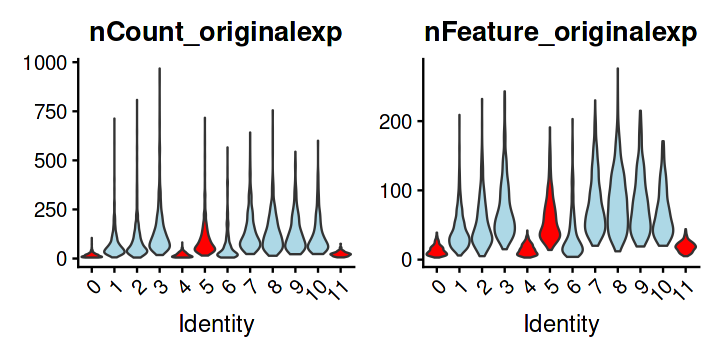

In [45]:
options(repr.plot.width=6, repr.plot.height=3)

#table(timepoint_pre_QC$E6.5@meta.data$seurat_clusters, timepoint_pre_QC$E6.5@meta.data$passed_QC)

# Determine the number of clusters
num_clusters <- length(levels(timepoint_pre_QC$E6.5@active.ident))

# Initialize cluster colors as all blue
cluster_colors <- rep("lightblue", num_clusters)
names(cluster_colors) <- levels(timepoint_pre_QC$E6.5@active.ident)

# Set specific clusters to red
cluster_colors[c("0", "4", "5", "11")] <- "red"

# Plot with specific cluster coloring
p1 <- VlnPlot(timepoint_pre_QC$E6.5, 
        features = "nCount_originalexp",
        pt.size = 0) + theme(legend.position = "none") + scale_fill_manual(values = cluster_colors)

p2 <- VlnPlot(timepoint_pre_QC$E6.5, 
        features = "nFeature_originalexp",
        pt.size = 0) + theme(legend.position = "none") + scale_fill_manual(values = cluster_colors)

p1 | p2

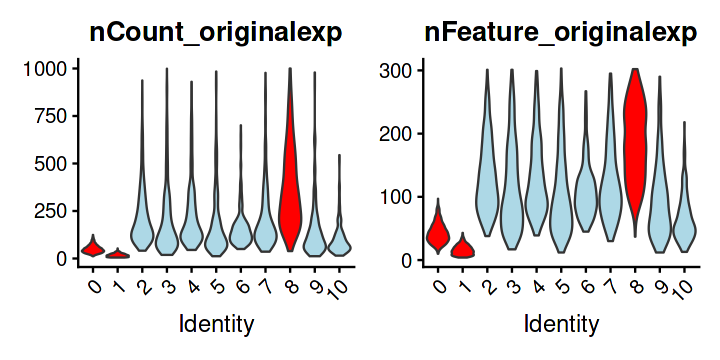

In [46]:
options(repr.plot.width=6, repr.plot.height=3)

#table(timepoint_pre_QC$E7.5@meta.data$seurat_clusters, timepoint_pre_QC$E7.5@meta.data$passed_QC)

# Determine the number of clusters
num_clusters <- length(levels(timepoint_pre_QC$E7.5@active.ident))

# Initialize cluster colors as all blue
cluster_colors <- rep("lightblue", num_clusters)
names(cluster_colors) <- levels(timepoint_pre_QC$E7.5@active.ident)

# Set specific clusters to red
cluster_colors[c("0", "1", "8")] <- "red"

# Plot with specific cluster coloring
p1 <- VlnPlot(timepoint_pre_QC$E7.5, 
        features = "nCount_originalexp",
        pt.size = 0) + theme(legend.position = "none") + scale_fill_manual(values = cluster_colors)

p2 <- VlnPlot(timepoint_pre_QC$E7.5, 
        features = "nFeature_originalexp",
        pt.size = 0) + theme(legend.position = "none") + scale_fill_manual(values = cluster_colors)

p1 | p2

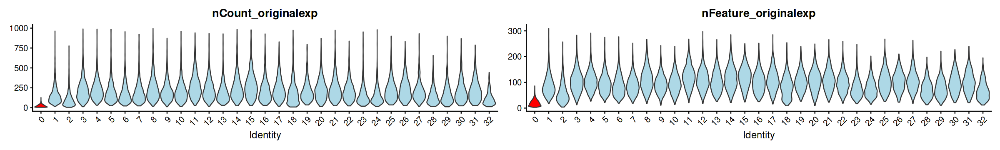

In [47]:
options(repr.plot.width=20, repr.plot.height=3)

#table(timepoint_pre_QC$E8.5@meta.data$seurat_clusters, timepoint_pre_QC$E8.5@meta.data$passed_QC)

# Determine the number of clusters
num_clusters <- length(levels(timepoint_pre_QC$E8.5@active.ident))

# Initialize cluster colors as all blue
cluster_colors <- rep("lightblue", num_clusters)
names(cluster_colors) <- levels(timepoint_pre_QC$E8.5@active.ident)

# Set specific clusters to red
cluster_colors[c("0")] <- "red"

# Plot with specific cluster coloring
p1 <- VlnPlot(timepoint_pre_QC$E8.5, 
        features = "nCount_originalexp",
        pt.size = 0) + theme(legend.position = "none") + scale_fill_manual(values = cluster_colors)

p2 <- VlnPlot(timepoint_pre_QC$E8.5, 
        features = "nFeature_originalexp",
        pt.size = 0) + theme(legend.position = "none") + scale_fill_manual(values = cluster_colors)

p1 | p2

## Find the Marker Genes for the Clusters in the Different Object

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23

Calculating cluster 24

Calculating cluster 25

Calculating cluster 26

Calculating cluster 27

Calculating cluster 28

Calculating cluster 29

Calculating cluster 30

Calculating cluster 31

Calculating cluster 32



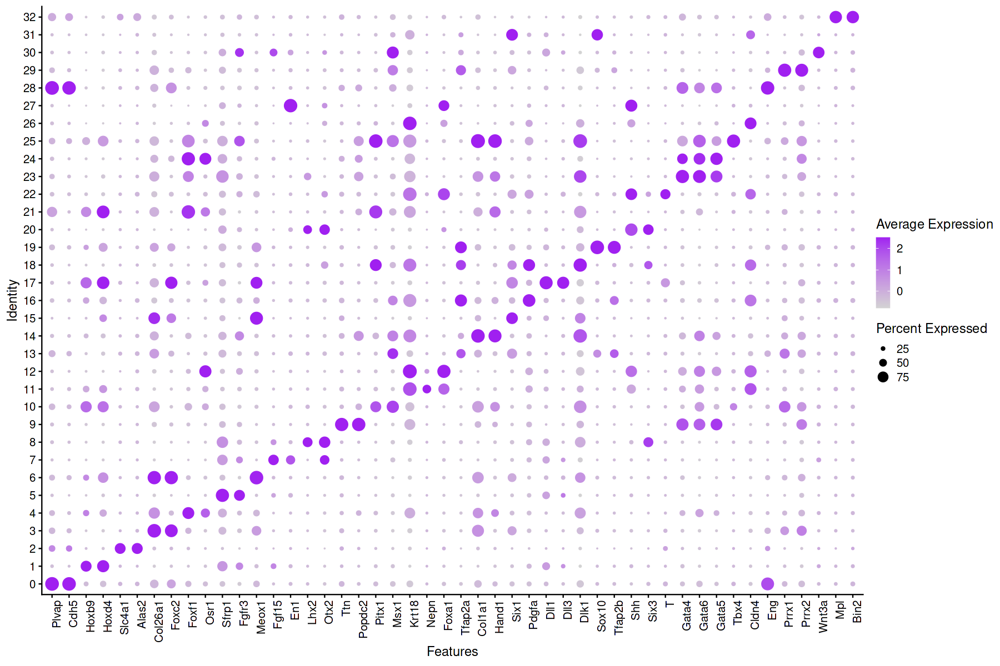

In [41]:
object <- timepoint_post_QC$E8.5
DefaultAssay(object) <- "originalexp"
markers <- FindAllMarkers(
                                  object,
                                  assay = "originalexp",
                                  features = rownames(object),
                                  slot = "data")

post_QC_E8.5_markers <- markers

markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.5) %>%
    slice_head(n = 2) %>%
    ungroup() -> top_markers

options(repr.plot.width=15, repr.plot.height=10)
DotPlot(object = object, 
        features = unique(c(top_markers$gene)),
        cols = c("lightgrey", "purple"),
        dot.min = 0) +
    theme(axis.text.x = element_text(angle = 90, hjust = 1)) 

## Explore spatial location of the clusters

In [39]:
colnames(timepoint_post_QC$E8.5@meta.data)

[1] "orig.ident"                            
 [2] "nCount_originalexp"                    
 [3] "nFeature_originalexp"                  
 [4] "dim1"                                  
 [5] "dim2"                                  
 [6] "dim3"                                  
 [7] "sample_id"                             
 [8] "embryo"                                
 [9] "pos"                                   
[10] "fov"                                   
[11] "Experiment"                            
[12] "DataStage"                             
[13] "Estage"                                
[14] "pixel_width"                           
[15] "area_um2"                              
[16] "sum"                                   
[17] "detected"                              
[18] "total"                                 
[19] "quality_keep"                          
[20] "sizeFactor"                            
[21] "cell_ID"                               
[22] "within_timepoint_integration_snn_res.1"
[23] "seurat_clusters"                       
[24] "embryo_name_updated"                   
[25] "embryo_name_updated_sf"

In [40]:
seqFISH_preQC_E8_ONLY <- seqFISH_preQC[,seqFISH_preQC@meta.data$Estage %in% c("E8.5")]

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from shila_umap_ to shilaumap_”


In [48]:
seqFISH_postQC_E8_ONLY <- timepoint_post_QC$E8.5
seqFISH_postQC_E8_ONLY <- AddMetaData(seqFISH_postQC_E8_ONLY, metadata = seqFISH_labels_updated)

In [49]:
colnames(seqFISH_postQC_E8_ONLY@meta.data)

[1] "orig.ident"                            
 [2] "nCount_originalexp"                    
 [3] "nFeature_originalexp"                  
 [4] "dim1"                                  
 [5] "dim2"                                  
 [6] "dim3"                                  
 [7] "sample_id"                             
 [8] "embryo"                                
 [9] "pos"                                   
[10] "fov"                                   
[11] "Experiment"                            
[12] "DataStage"                             
[13] "Estage"                                
[14] "pixel_width"                           
[15] "area_um2"                              
[16] "sum"                                   
[17] "detected"                              
[18] "total"                                 
[19] "quality_keep"                          
[20] "sizeFactor"                            
[21] "cell_ID"                               
[22] "within_timepoint_integration_snn_res.1"
[23] "seurat_clusters"                       
[24] "embryo_name_updated"                   
[25] "embryo_name_updated_sf"                
[26] "nearest_cell_label_transfer"           
[27] "celltype_extended_atlas"               
[28] "stage"                                 
[29] "anatomy"                               
[30] "somite_count"

In [50]:
#get seurat clusters for the post_QC integrated object for E6_E7
post_QC_E8_embryos_ONLY_seurat_clusters <- subset(seqFISH_postQC_E8_ONLY@meta.data, select = within_timepoint_integration_snn_res.1)
colnames(post_QC_E8_embryos_ONLY_seurat_clusters) <- "post_QC_clusters"

head(post_QC_E8_embryos_ONLY_seurat_clusters)

,post_QC_clusters
,<fct>
embryo1_Pos0_cell3,10
embryo1_Pos0_cell4,21
embryo1_Pos0_cell5,21
embryo1_Pos0_cell6,21
embryo1_Pos0_cell7,21
embryo1_Pos0_cell8,11


In [51]:
seqFISH_preQC_E8_ONLY <- AddMetaData(seqFISH_preQC_E8_ONLY, metadata = post_QC_E8_embryos_ONLY_seurat_clusters)

In [52]:
# Convert factor column to character
seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters <- as.character(seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters)

# Check if the column contains NA values
na_indices <- is.na(seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters)

# Assign "failed_qc" only to NA values
seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters[na_indices] <- "failed_qc"

In [53]:
table(seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters)


        0         1        10        11        12        13        14        15 
     3986      3944      1639      1621      1346      1340      1262      1208 
       16        17        18        19         2        20        21        22 
     1165      1120      1056       998      3751       976       967       940 
       23        24        25        26        27        28        29         3 
      807       755       744       712       710       687       654      3647 
       30        31        32         4         5         6         7         8 
      527       353        78      3440      3163      2822      2660      2588 
        9 failed_qc 
     2285      4725 

In [54]:
# Ensure uniqueness and add new levels
seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters <- factor(seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters)

In [55]:
head(seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters)

[1] 10 21 21 21 21 11
34 Levels: 0 1 10 11 12 13 14 15 16 17 18 19 2 20 21 22 23 24 25 26 27 ... failed_qc

In [56]:
# Reorder the levels of the factor variable
seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters <- factor(
  seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters,
  levels = c("failed_qc", sort(as.numeric(levels(seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters))))
)

Warning message in sort(as.numeric(levels(seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters))):
“NAs introduced by coercion”


In [57]:
table(seqFISH_preQC_E8_ONLY@meta.data$post_QC_cluster)


failed_qc         0         1         2         3         4         5         6 
     4725      3986      3944      3751      3647      3440      3163      2822 
        7         8         9        10        11        12        13        14 
     2660      2588      2285      1639      1621      1346      1340      1262 
       15        16        17        18        19        20        21        22 
     1208      1165      1120      1056       998       976       967       940 
       23        24        25        26        27        28        29        30 
      807       755       744       712       710       687       654       527 
       31        32 
      353        78 

In [57]:
str(seqFISH_preQC_E8_ONLY@meta.data$post_QC_clusters)

 Factor w/ 34 levels "failed_qc","0",..: 12 23 23 23 23 13 23 23 2 13 ...


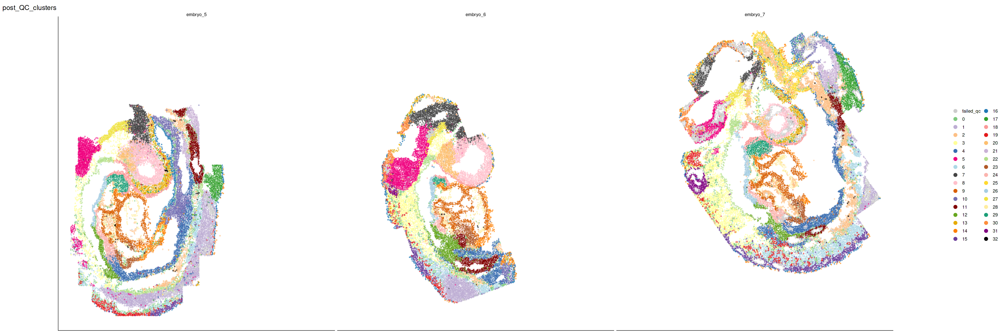

In [64]:
options(repr.plot.width=30, repr.plot.height=10)

pt_size <- 0.5
p4 <- DimPlot(seqFISH_preQC_E8_ONLY, 
              reduction = "spatial",
              group.by = "post_QC_clusters",
              split.by = "embryo_name_updated",
              order = TRUE,
              raster = TRUE,
        pt.size = pt_size) +
      scale_color_manual(values = post_QC_cluster_colors_E8) +
      theme_void() +
      coord_fixed() +
      theme(text = element_text(family = "Helvetica", size = 12),  # Set font family and size
            legend.position = "right",
            axis.line = element_line(color = "black",  size = 0.3))

p4

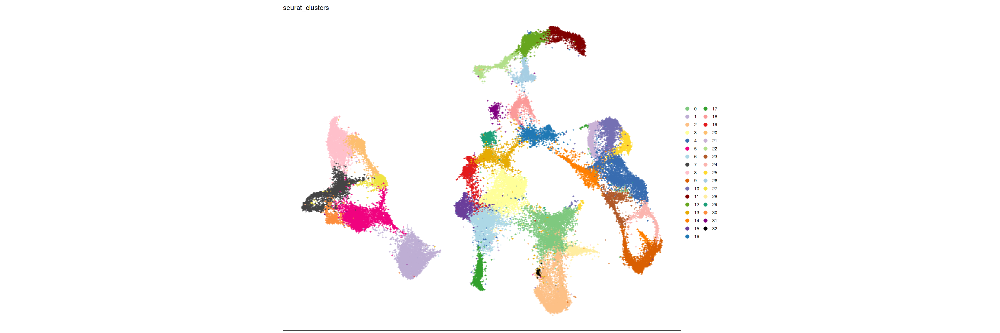

In [68]:
options(repr.plot.width=30, repr.plot.height=10)

pt_size <- 0.5
p4 <- DimPlot(seqFISH_postQC_E8_ONLY, 
              reduction = "umap",
              group.by = "seurat_clusters",
              #split.by = "embryo_name_updated",
              order = FALSE,
              raster = TRUE,
        pt.size = pt_size) +
      scale_color_manual(values = post_QC_cluster_colors_E8) +
      theme_void() +
      coord_fixed() +
      theme(text = element_text(family = "Helvetica", size = 12),  # Set font family and size
            legend.position = "right",
            axis.line = element_line(color = "black",  size = 0.3))

p4

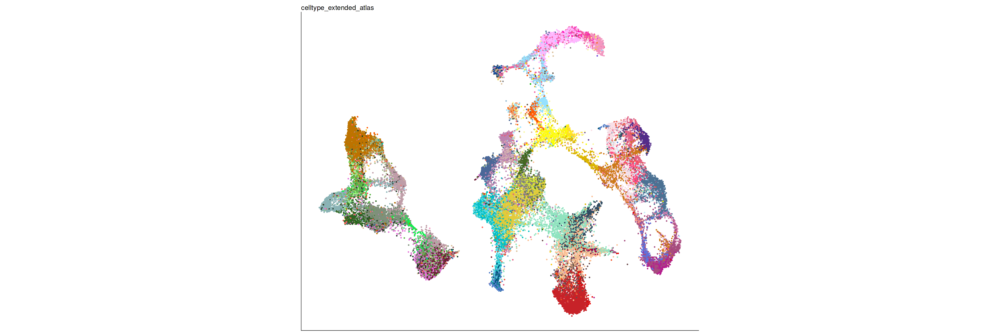

In [115]:
options(repr.plot.width=30, repr.plot.height=10)

pt_size <- 0.5
p4 <- DimPlot(seqFISH_postQC_E8_ONLY, 
              reduction = "umap",
              group.by = "celltype_extended_atlas",
              #split.by = "embryo_name_updated",
              order = FALSE,
              raster = FALSE,
        pt.size = pt_size) +
      scale_color_manual(values = extended.colors) +
      theme_void() +
      coord_fixed() +
      theme(text = element_text(family = "Helvetica", size = 12),  # Set font family and size
            legend.position = "none",
            axis.line = element_line(color = "black",  size = 0.3))

p4

In [90]:
colnames(seqFISH_postQC_E8_ONLY@meta.data)

[1] "orig.ident"                            
 [2] "nCount_originalexp"                    
 [3] "nFeature_originalexp"                  
 [4] "dim1"                                  
 [5] "dim2"                                  
 [6] "dim3"                                  
 [7] "sample_id"                             
 [8] "embryo"                                
 [9] "pos"                                   
[10] "fov"                                   
[11] "Experiment"                            
[12] "DataStage"                             
[13] "Estage"                                
[14] "pixel_width"                           
[15] "area_um2"                              
[16] "sum"                                   
[17] "detected"                              
[18] "total"                                 
[19] "quality_keep"                          
[20] "sizeFactor"                            
[21] "cell_ID"                               
[22] "within_timepoint_integration_snn_res.1"
[23] "seurat_clusters"                       
[24] "embryo_name_updated"                   
[25] "embryo_name_updated_sf"

In [ ]:
options(repr.plot.width=30, repr.plot.height=10)

pt_size <- 0.5
p4 <- DimPlot(seqFISH_postQC_E8_ONLY, 
              reduction = "umap",
              group.by = "seurat_clusters",
              #split.by = "embryo_name_updated",
              order = FALSE,
              raster = TRUE,
        pt.size = pt_size) +
      scale_color_manual(values = post_QC_cluster_colors_E8) +
      theme_void() +
      coord_fixed() +
      theme(text = element_text(family = "Helvetica", size = 12),  # Set font family and size
            legend.position = "right",
            axis.line = element_line(color = "black",  size = 0.3))

p4

## UMAP FIGURE E6_E7 POST_QC

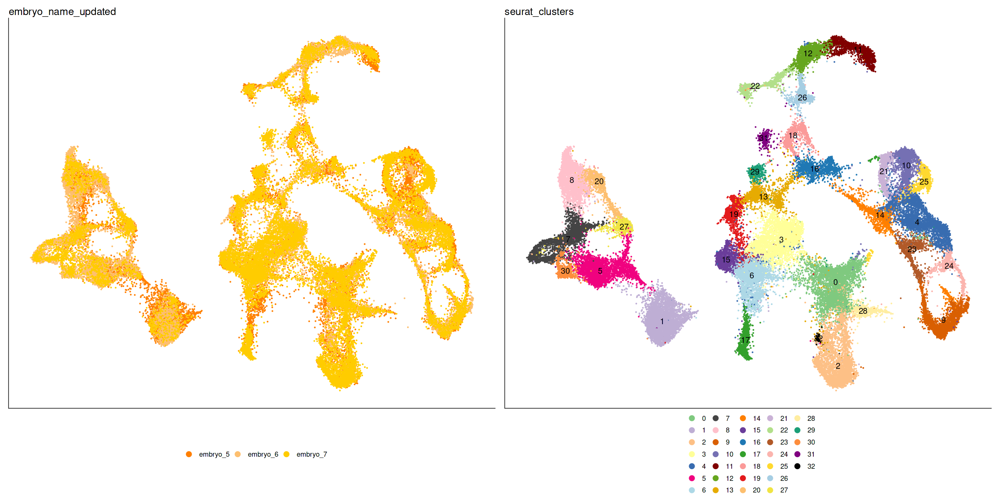

In [87]:
options(repr.plot.width=20, repr.plot.height=10)
width <- 5
height <- 5
pt_size <- 0.1

object <- seqFISH_postQC_E8_ONLY

p1 <- DimPlot(object, 
        reduction = "umap",
        group.by = "embryo_name_updated",
        order = FALSE,
        pt.size = pt_size) +
  theme_void() +
  coord_fixed() +
  scale_color_manual(values = embryo_colors) +
 theme(text = element_text(family = "Helvetica", size = 12),  # Set font family and size
        legend.position = "bottom",
        axis.line = element_line(color = "black",  size = 0.3))  # Make all axis lines black

p2 <- DimPlot(object, 
        reduction = "umap",
        group.by = "seurat_clusters",
        order = FALSE,
        label = TRUE,
        #label.size = 10,
        pt.size = pt_size) +
  theme_void() +
  coord_fixed() +
  scale_color_manual(values = post_QC_cluster_colors_E8) +
 theme(text = element_text(family = "Helvetica", size = 12),  # Set font family and size
        legend.position = "bottom",
        axis.line = element_line(color = "black",  size = 0.3))  # Make all axis lines black

# Save the grid plot as .svg file to specific file path
ggsave(filename = "projects/03_seqFISH_FINAL/code/figure_generation/outputs/fig_s2_v2/umap_colored_by_embryo.svg", plot = p1, device = "svg",
      width = width,
      height = height)

# Save the grid plot as .svg file to specific file path
ggsave(filename = "projects/03_seqFISH_FINAL/code/figure_generation/outputs/fig_s2_v2/umap_colored_by_seurat_cluster.svg", plot = p2, device = "svg",
      width = width,
      height = height)

p1 | p2

## Spatial FIGURE WITH CLUSTER E6_E7 ONLY

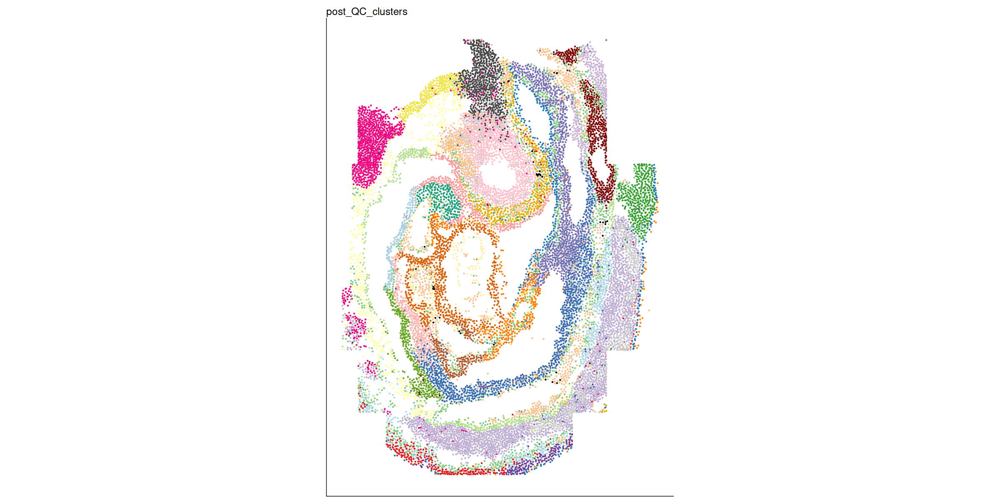

In [83]:
options(repr.plot.width=20, repr.plot.height=10)
width <- 5
height <- 5
pt_size <- 0.2

object <- seqFISH_preQC_E8_ONLY[,seqFISH_preQC_E8_ONLY@meta.data$embryo_name_updated %in% "embryo_5"]

p1 <- DimPlot(object, 
        reduction = "spatial",
        group.by = "post_QC_clusters",
        order = FALSE,
        #label = TRUE,
        #label.size = 10,
        pt.size = pt_size) +
  theme_void() +
  coord_fixed() +
  scale_color_manual(values = post_QC_cluster_colors_E8) +
 theme(text = element_text(family = "Helvetica", size = 12),  # Set font family and size
        legend.position = "none",
        axis.line = element_line(color = "black",  size = 0.3))  # Make all axis lines black

# Save the grid plot as .svg file to specific file path
ggsave(filename = "projects/03_seqFISH_FINAL/code/figure_generation/outputs/fig_s2_v2/embryo_5_clusters.svg", plot = p1, device = "svg",
      width = width,
      height = height)

p1

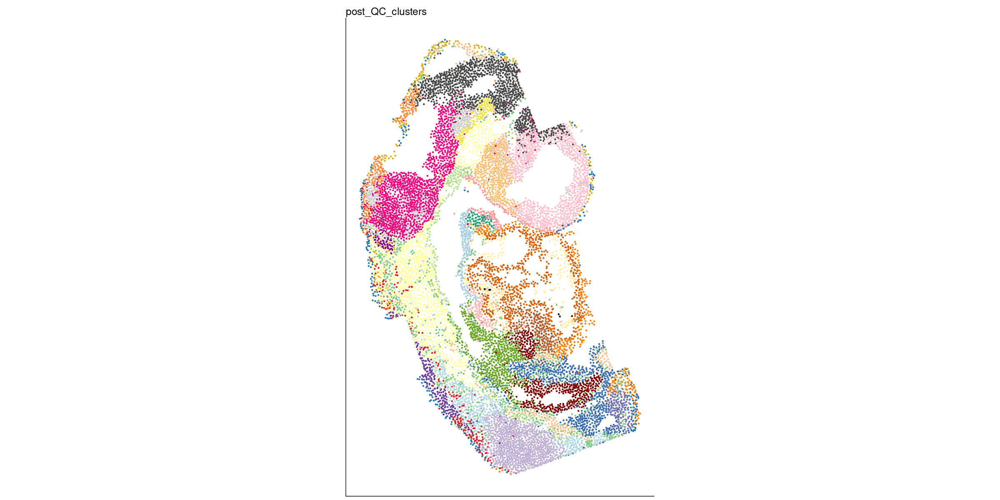

In [84]:
options(repr.plot.width=20, repr.plot.height=10)
width <- 5
height <- 5
pt_size <- 0.2

object <- seqFISH_preQC_E8_ONLY[,seqFISH_preQC_E8_ONLY@meta.data$embryo_name_updated %in% "embryo_6"]

p1 <- DimPlot(object, 
        reduction = "spatial",
        group.by = "post_QC_clusters",
        order = FALSE,
        #label = TRUE,
        #label.size = 10,
        pt.size = pt_size) +
  theme_void() +
  coord_fixed() +
  scale_color_manual(values = post_QC_cluster_colors_E8) +
 theme(text = element_text(family = "Helvetica", size = 12),  # Set font family and size
        legend.position = "none",
        axis.line = element_line(color = "black",  size = 0.3))  # Make all axis lines black

# Save the grid plot as .svg file to specific file path
ggsave(filename = "projects/03_seqFISH_FINAL/code/figure_generation/outputs/fig_s2_v2/embryo_6_clusters.svg", plot = p1, device = "svg",
      width = width,
      height = height)

p1

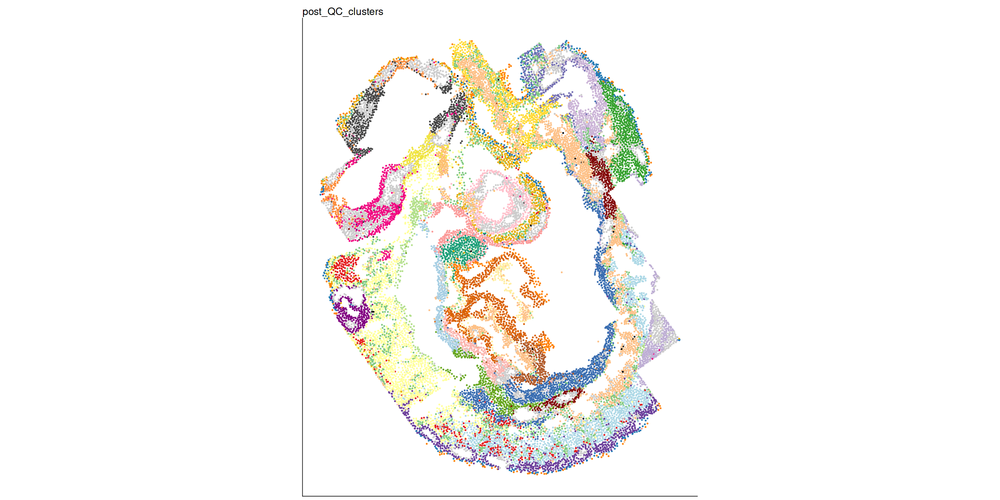

In [85]:
options(repr.plot.width=20, repr.plot.height=10)
width <- 5
height <- 5
pt_size <- 0.2

object <- seqFISH_preQC_E8_ONLY[,seqFISH_preQC_E8_ONLY@meta.data$embryo_name_updated %in% "embryo_7"]

p1 <- DimPlot(object, 
        reduction = "spatial",
        group.by = "post_QC_clusters",
        order = FALSE,
        #label = TRUE,
        #label.size = 10,
        pt.size = pt_size) +
  theme_void() +
  coord_fixed() +
  scale_color_manual(values = post_QC_cluster_colors_E8) +
 theme(text = element_text(family = "Helvetica", size = 12),  # Set font family and size
        legend.position = "none",
        axis.line = element_line(color = "black",  size = 0.3))  # Make all axis lines black

# Save the grid plot as .svg file to specific file path
ggsave(filename = "projects/03_seqFISH_FINAL/code/figure_generation/outputs/fig_s2_v2/embryo_7_clusters.svg", plot = p1, device = "svg",
      width = width,
      height = height)

p1

## Gene Expression Plots for Marker Genes

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23

Calculating cluster 24

Calculating cluster 25

Calculating cluster 26

Calculating cluster 27

Calculating cluster 28

Calculating cluster 29

Calculating cluster 30

Calculating cluster 31

Calculating cluster 32



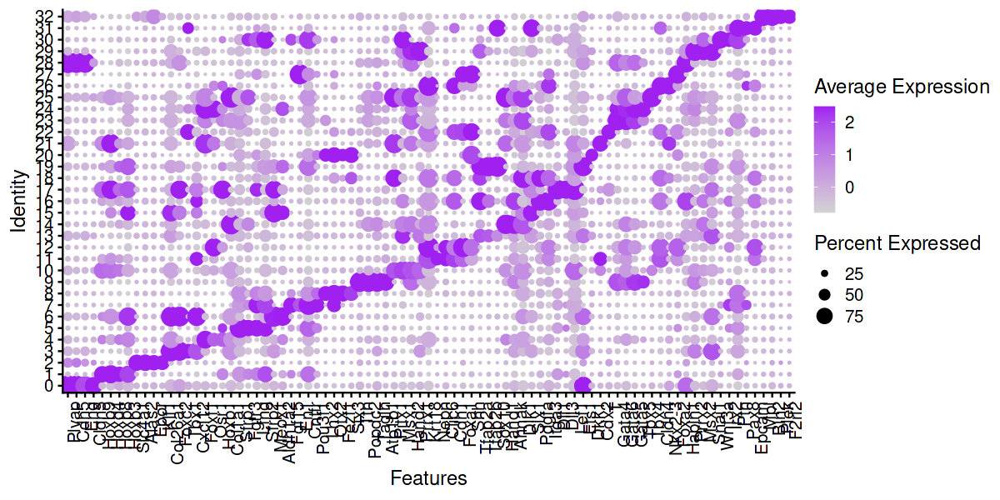

In [75]:
object <- seqFISH_postQC_E8_ONLY
DefaultAssay(object) <- "originalexp"
markers <- FindAllMarkers(
                                  object,
                                  assay = "originalexp",
                                  features = rownames(object),
                                  slot = "data")
post_QC_E8.5_markers <- markers

markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.5) %>%
    slice_head(n = 4) %>%
    ungroup() -> top_markers


options(repr.plot.width=10, repr.plot.height=5)
DotPlot(object = object, 
        features = unique(c(top_markers$gene)),
        cols = c("lightgrey", "purple"),
        dot.min = 0) +
    theme(axis.text.x = element_text(angle = 90, hjust = 1)) 

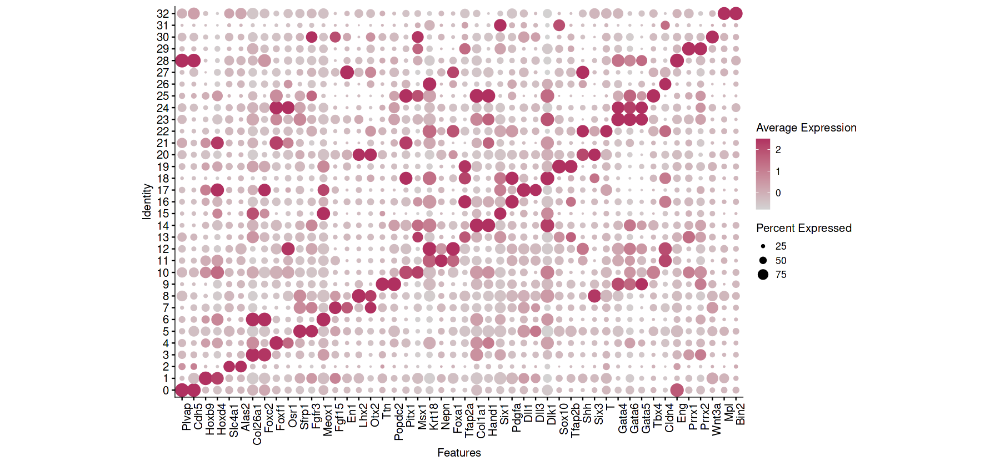

In [119]:
options(repr.plot.width=15, repr.plot.height=7)
width <- 20
height <- 10

markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.5) %>%
    slice_head(n = 2) %>%
    ungroup() -> top_markers

p1 <- DotPlot(object = object, 
        features = unique(c(top_markers$gene)),
        cols = c("lightgrey", "maroon"),
        dot.min = 0) +
        theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
        coord_fixed() +
        theme(text = element_text(family = "Helvetica", size = 12),  # Set font family and size
        legend.position = "right",
        axis.line = element_line(color = "black",  size = 0.3))  # Make all axis lines black

# Save the grid plot as .svg file to specific file path
ggsave(filename = "projects/03_seqFISH_FINAL/code/figure_generation/outputs/fig_s2_v2/marker_genes_clusters_E8.svg", plot = p1, device = "svg",
      width = width,
      height = height)

p1

In [118]:
help(DotPlot)

DotPlot {Seurat},R Documentation
object,Seurat object
assay,"Name of assay to use, defaults to the active assay"
features,"Input vector of features, or named list of feature vectors if feature-grouped panels are desired (replicates the functionality of the old SplitDotPlotGG)"
cols,"Colors to plot: the name of a palette from RColorBrewer::brewer.pal.info, a pair of colors defining a gradient, or 3+ colors defining multiple gradients (if split.by is set)"
col.min,Minimum scaled average expression threshold (everything smaller will be set to this)
col.max,Maximum scaled average expression threshold (everything larger will be set to this)
dot.min,The fraction of cells at which to draw the smallest dot (default is 0). All cell groups with less than this expressing the given gene will have no dot drawn.
dot.scale,"Scale the size of the points, similar to cex"
idents,Identity classes to include in plot (default is all)
group.by,Factor to group the cells by


## QUALITY CONTROL FIGURES for the EALRY TIMEPOINT EMBRYOS

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


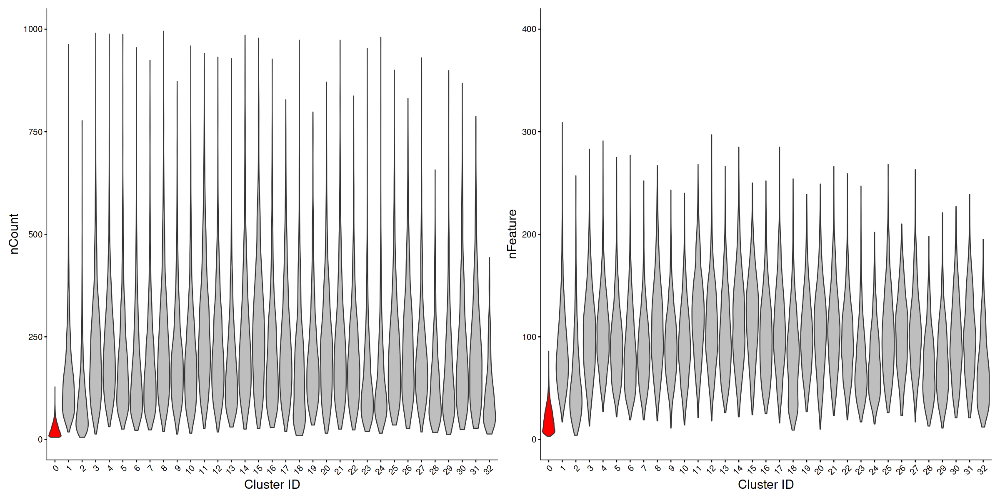

In [79]:
options(repr.plot.width=20, repr.plot.height=10)
width <- 5
height <- 2.5
pt_size <- 0.5
font_size <- 18

# Determine the number of clusters
num_clusters <- length(levels(timepoint_pre_QC$E8.5@active.ident))

# Initialize cluster colors as all blue
cluster_colors <- rep("grey", num_clusters)
names(cluster_colors) <- levels(timepoint_pre_QC$E8.5@active.ident)

# Set specific clusters to red
cluster_colors[c("0")] <- "red"

# Plot with specific cluster coloring
lower_limit <- 0
upper_limit <- 1000
p1 <- VlnPlot(timepoint_pre_QC$E8.5, 
              features = "nCount_originalexp",
              pt.size = 0) + 
      theme(legend.position = "none") +
      ylim(lower_limit, upper_limit) +
      scale_fill_manual(values = cluster_colors) + 
      theme(text = element_text(family = "Helvetica", size = font_size),  # Set font family and size
            axis.line = element_line(color = "black",  size = 0.3)) +  # Make all axis lines black
      xlab("Cluster ID") +  # Set x-axis label to Cluster ID
      ylab("nCount") +  # Set y-axis label
      labs(title = NULL)  # Remove the title


lower_limit <- 0
upper_limit <- 400
p2 <- VlnPlot(timepoint_pre_QC$E8.5, 
              features = "nFeature_originalexp",
              pt.size = 0) + 
      theme(legend.position = "none") +
      ylim(lower_limit, upper_limit) +
      scale_fill_manual(values = cluster_colors) + 
      theme(text = element_text(family = "Helvetica", size = font_size),  # Set font family and size
            axis.line = element_line(color = "black",  size = 0.3)) +  # Make all axis lines black
      xlab("Cluster ID") +  # Set x-axis label to Cluster ID
      ylab("nFeature") +  # Set y-axis label
      labs(title = NULL)  # Remove the title

# Save the grid plot as .svg file to specific file path
ggsave(filename = "projects/03_seqFISH_FINAL/code/figure_generation/outputs/fig_s2_v2/QC_nCounts_E8.svg", plot = p1, device = "svg",
      width = width,
      height = height)

# Save the grid plot as .svg file to specific file path
ggsave(filename = "projects/03_seqFISH_FINAL/code/figure_generation/outputs/fig_s2_v2/QC_nFeatures_E8.svg", plot = p2, device = "svg",
      width = width,
      height = height)

p1 | p2

## Explore clusters per embryo

In [80]:
options(repr.plot.width=5, repr.plot.height=6)

# Create the table of cell counts
cell_counts <- table(seqFISH_postQC_E8_ONLY@meta.data$seurat_clusters, seqFISH_postQC_E8_ONLY@meta.data$embryo_name_updated_sf)

# Compute proportions within each embryo
proportions <- apply(cell_counts, 2, function(x) x/sum(x))

# Print the proportions
head(proportions)
                     
# Sum proportions for each embryo
sums <- colSums(proportions)

# Check if sums add up to 1
all_equal <- all(round(sums, 6) == 1)

# Print the sums
print(sums)

# Print if sums add up to 1
print(all_equal)

,5,6,7
0,0.07258814,0.05700416,0.08645696
1,0.13577480,0.07246879,0.01954229
2,0.04717136,0.02274619,0.12055001
3,0.02935228,0.08848821,0.08636278
4,0.06766876,0.05429958,0.06682049
5,0.06039902,0.10693481,0.02429836


5 6 7 
1 1 1 
[1] TRUE


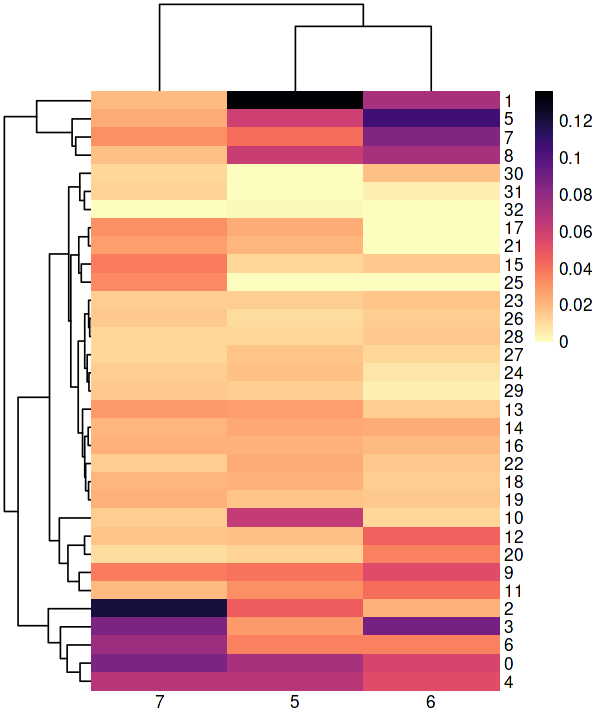

In [81]:
options(repr.plot.width=5, repr.plot.height=6)
# Create the heatmap with inverted plasma color scale and no cell borders
p1 <- pheatmap(proportions, color = rev(magma(100)), 
               border_color = NA,
               angle_col = 0,
               cluster_rows = TRUE,
               cluster_cols = TRUE)

In [82]:
options(repr.plot.width=10, repr.plot.height=2)
width <- 6
height <- 6

# Save the grid plot as .svg file to specific file path
ggsave(filename = "projects/03_seqFISH_FINAL/code/figure_generation/outputs/fig_s2_v2/cell_type_proportions_heatmap.svg", plot = p1, device = "svg",
      width = width,
      height = height)

## Generate a collision table for Stabmap versus the original labels

In [99]:
options(repr.plot.width=5, repr.plot.height=6)

# Create the table of cell counts
cell_counts <- table(seqFISH_postQC_E8_ONLY@meta.data$seurat_clusters, seqFISH_postQC_E8_ONLY@meta.data$celltype_extended_atlas)

# Compute proportions within each embryo
proportions <- apply(cell_counts, 2, function(x) x/sum(x))

# Print the proportions
head(proportions)
                     
# Sum proportions for each embryo
sums <- colSums(proportions)

# Check if sums add up to 1
all_equal <- all(round(sums, 6) == 1)

# Print the sums
print(sums)

# Print if sums add up to 1
print(all_equal)

,Allantois,Allantois endothelium,Amniotic ectoderm,Anterior Primitive Streak,Anterior cardiopharyngeal progenitors,Anterior somitic tissues,Blood progenitors,Branchial arch neural crest,Cardiomyocytes FHF 1,Cardiomyocytes FHF 2,...,Somitic mesoderm,Spinal cord progenitors,Surface ectoderm,Thyroid primordium,Venous endothelium,Ventral forebrain progenitors,Ventral hindbrain progenitors,Visceral endoderm,YS endothelium,YS mesothelium
0,0.003120125,0.887820513,0.002808989,0.00000000,0.00000000,0.000000000,0.036544850,0.007400555,0.0000000000,0.000000000,...,0,0.000000000,0,0,0.9782609,0.00000000,0.0000000000,0.00000000,1,0.00000
1,0.000000000,0.000000000,0.000000000,0.01895735,0.01428571,0.000000000,0.003322259,0.000000000,0.0000000000,0.000000000,...,0,0.954545455,0,0,0.0000000,0.01216545,0.1783804431,0.00000000,0,0.00000
2,0.000000000,0.001068376,0.002808989,0.03791469,0.00000000,0.000000000,0.860465116,0.001850139,0.0000000000,0.004651163,...,0,0.001057082,0,0,0.0000000,0.00000000,0.0007639419,0.05405405,0,0.00000
3,0.000000000,0.000000000,0.000000000,0.00000000,0.68571429,0.964684015,0.000000000,0.055504163,0.0006830601,0.000000000,...,0,0.000000000,0,0,0.0000000,0.00000000,0.0007639419,0.00000000,0,0.00000
4,0.004680187,0.000000000,0.005617978,0.00000000,0.07142857,0.005576208,0.003322259,0.003700278,0.0047814208,0.000000000,...,0,0.006342495,0,0,0.0000000,0.00000000,0.0011459129,0.00000000,0,0.09375
5,0.000000000,0.000000000,0.000000000,0.00000000,0.00000000,0.000000000,0.000000000,0.000000000,0.0000000000,0.000000000,...,0,0.004228330,0,0,0.0000000,0.00243309,0.7631779985,0.00000000,0,0.00000


                                    Allantois 
                                            1 
                        Allantois endothelium 
                                            1 
                            Amniotic ectoderm 
                                            1 
                    Anterior Primitive Streak 
                                            1 
        Anterior cardiopharyngeal progenitors 
                                            1 
                     Anterior somitic tissues 
                                            1 
                            Blood progenitors 
                                            1 
                  Branchial arch neural crest 
                                            1 
                         Cardiomyocytes FHF 1 
                                            1 
                         Cardiomyocytes FHF 2 
                                            1 
                         Cardiomyocytes SHF 1 
             

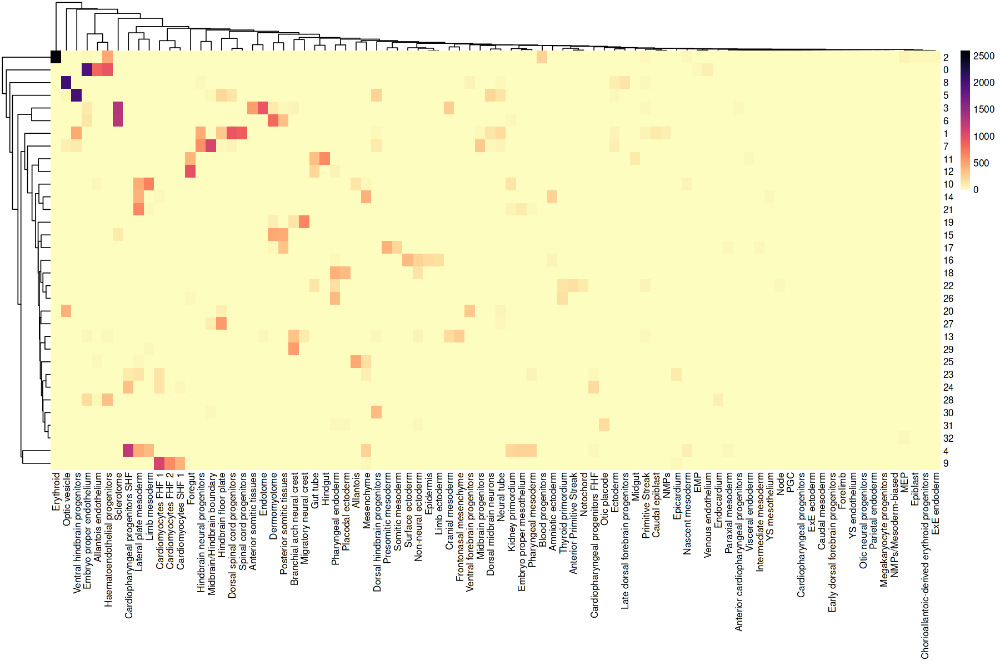

In [114]:
options(repr.plot.width=15, repr.plot.height=10)
# Create the heatmap with inverted plasma color scale and no cell borders
p1 <- pheatmap(cell_counts, color = rev(magma(100)), 
               border_color = NA,
               angle_col = 90,
               cluster_rows = TRUE,
               cluster_cols = TRUE,
               scale_row = TRUE,
               scale_col = TRUE)

In [82]:
options(repr.plot.width=10, repr.plot.height=2)
width <- 6
height <- 6

# Save the grid plot as .svg file to specific file path
ggsave(filename = "projects/03_seqFISH_FINAL/code/figure_generation/outputs/fig_s2_v2/cell_type_proportions_heatmap.svg", plot = p1, device = "svg",
      width = width,
      height = height)

## Update Cell Type Annotations for the Seurat Clusters (PostQC) in the Early and E8 Embryos

In [16]:
post_QC_annotations_E6_E7 <- c(
  "failed_qc" = "#CCCCCC",
  "0" = "rostral epiblast",   # Green
  "1" = "ExE mesoderm",   # Purple
  "2" = "primitive streak",   # Orange
  "3" = "distal ExE ectoderm #1",   # Yellow
  "4" = "visceral endoderm #1",   # Blue
  "5" = "caudal epiblast",   # Red
  "6" = "epiblast",   # Light blue (adjusted)
  "7" = "proximal ExE ectoderm #2",   # Dark grey (adjusted)
  "8" = "proximal ExE ectoderm #1",   # Pale pink (adjusted)
  "9" = "distal ExE ectoderm #2",   # Dark orange
  "10" = "ExE endoderm",  # Dark purple
  "11" = "visceral endoderm #2",  # Maroon (adjusted)
  "12" = "haematoendothelial",  # Dark green
  "13" = "definitive endoderm",  # Dark yellow
  "14" = "ExE ectoderm #3",  # Orange
  "15" = "mesodermal wings"   # Dark purple (adjusted)
)

In [18]:
post_QC_annotations_E8 <- c(
  "failed_qc" = "#CCCCCC",
  "0" = "endothelium #1",    # Green
  "1" = "spinal cord",    # Purple
  "2" = "blood",    # Orange
  "3" = "anterior somitic tissue",    # Yellow
  "4" = "lateral plate mesoderm",    # Blue
  "5" = "brain #1",    # Red
  "6" = "posterior somitic tissue",    # Light blue
  "7" = "brain #2",    # Dark grey
  "8" = "brain #3",    # Pale pink
  "9" = "cardiomyocytes",    # Dark orange
  "10" = "posterior somatic LP mesoderm #2",   # Dark purple
  "11" = "hindgut",   # Maroon
  "12" = "midgut",   # Dark green
  "13" = "neural crest #1",   # Dark yellow
  "14" = "mesenchyme",   # Orange
  "15" = "paraxial mesoderm",   # Dark purple
  "16" = "surface ectoderm #1",   # Medium blue
  "17" = "presomitic mesoderm",   # Green (adjusted)
  "18" = "surface ectoderm #2",   # Light red
  "19" = "neural crest #2",   # Red (adjusted)
  "20" = "brain #6",   # Light orange
  "21" = "posterior somatic LP mesoderm #1",   # Lavender
  "22" = "dorsal foregut",   # Light green (adjusted)
  "23" = "splanchnic LP mesoderm #1",   # Brown
  "24" = "splanchnic LP mesoderm #2",   # Light pink
  "25" = "allantois",   # Yellow (adjusted)
  "26" = "ventral foregut",   # Light blue (adjusted)
  "27" = "brain #5",   # Yellow (adjusted)
  "28" = "endothelium #2",   # Light orange (adjusted)
  "29" = "neural crest #3",   # Dark green (adjusted)
  "30" = "brain #4",   # Dark orange (adjusted)
  "31" = "otic placode",   # Purple (adjusted)
  "32" = "macrophage"    # Black
)

In [38]:
post_QC_early_embryos_ONLY

An object of class Seurat 
1053 features across 9237 samples within 3 assays 
Active assay: across_timepoint_integration (351 features, 351 variable features)
 2 other assays present: originalexp, within_timepoint_integration
 2 dimensional reductions calculated: pca, umap

In [58]:
seqFISH_postQC_E8_ONLY

An object of class Seurat 
702 features across 53951 samples within 2 assays 
Active assay: within_timepoint_integration (351 features, 351 variable features)
 1 other assay present: originalexp
 2 dimensional reductions calculated: pca, umap

In [61]:
colnames(post_QC_early_embryos_ONLY@meta.data)

[1] "orig.ident"                              
 [2] "nCount_originalexp"                      
 [3] "nFeature_originalexp"                    
 [4] "dim1"                                    
 [5] "dim2"                                    
 [6] "dim3"                                    
 [7] "sample_id"                               
 [8] "embryo"                                  
 [9] "pos"                                     
[10] "fov"                                     
[11] "Experiment"                              
[12] "DataStage"                               
[13] "Estage"                                  
[14] "pixel_width"                             
[15] "area_um2"                                
[16] "sum"                                     
[17] "detected"                                
[18] "total"                                   
[19] "quality_keep"                            
[20] "sizeFactor"                              
[21] "cell_ID"                                 
[22] "within_timepoint_integration_snn_res.1"  
[23] "seurat_clusters"                         
[24] "across_timepoint_integration_snn_res.1.2"
[25] "embryo_name_updated"                     
[26] "embryo_name_updated_sf"

In [60]:
seqFISH_postQC_E8_ONLY@meta.data$postQC_annotations <- recode(seqFISH_postQC_E8_ONLY@meta.data$within_timepoint_integration_snn_res.1,
  "0" = "endothelium #1",    # Green
  "1" = "spinal cord",    # Purple
  "2" = "blood",    # Orange
  "3" = "anterior somitic tissue",    # Yellow
  "4" = "lateral plate mesoderm",    # Blue
  "5" = "brain #1",    # Red
  "6" = "posterior somitic tissue",    # Light blue
  "7" = "brain #2",    # Dark grey
  "8" = "brain #3",    # Pale pink
  "9" = "cardiomyocytes",    # Dark orange
  "10" = "posterior somatic LP mesoderm #2",   # Dark purple
  "11" = "hindgut",   # Maroon
  "12" = "midgut",   # Dark green
  "13" = "neural crest #1",   # Dark yellow
  "14" = "mesenchyme",   # Orange
  "15" = "paraxial mesoderm",   # Dark purple
  "16" = "surface ectoderm #1",   # Medium blue
  "17" = "presomitic mesoderm",   # Green (adjusted)
  "18" = "surface ectoderm #2",   # Light red
  "19" = "neural crest #2",   # Red (adjusted)
  "20" = "brain #6",   # Light orange
  "21" = "posterior somatic LP mesoderm #1",   # Lavender
  "22" = "dorsal foregut",   # Light green (adjusted)
  "23" = "splanchnic LP mesoderm #1",   # Brown
  "24" = "splanchnic LP mesoderm #2",   # Light pink
  "25" = "allantois",   # Yellow (adjusted)
  "26" = "ventral foregut",   # Light blue (adjusted)
  "27" = "brain #5",   # Yellow (adjusted)
  "28" = "endothelium #2",   # Light orange (adjusted)
  "29" = "neural crest #3",   # Dark green (adjusted)
  "30" = "brain #4",   # Dark orange (adjusted)
  "31" = "otic placode",   # Purple (adjusted)
  "32" = "macrophage")    # Black

In [62]:
post_QC_early_embryos_ONLY@meta.data$postQC_annotations <- recode(post_QC_early_embryos_ONLY@meta.data$across_timepoint_integration_snn_res.1.2,
  "0" = "rostral epiblast",   # Green
  "1" = "ExE mesoderm",   # Purple
  "2" = "primitive streak",   # Orange
  "3" = "distal ExE ectoderm #1",   # Yellow
  "4" = "visceral endoderm #1",   # Blue
  "5" = "caudal epiblast",   # Red
  "6" = "epiblast",   # Light blue (adjusted)
  "7" = "proximal ExE ectoderm #2",   # Dark grey (adjusted)
  "8" = "proximal ExE ectoderm #1",   # Pale pink (adjusted)
  "9" = "distal ExE ectoderm #2",   # Dark orange
  "10" = "ExE endoderm",  # Dark purple
  "11" = "visceral endoderm #2",  # Maroon (adjusted)
  "12" = "haematoendothelial",  # Dark green
  "13" = "definitive endoderm",  # Dark yellow
  "14" = "ExE ectoderm #3",  # Orange
  "15" = "mesodermal wings")   # Dark purple (adjusted)

In [63]:
postQC_early_annotations <- subset(post_QC_early_embryos_ONLY@meta.data, select = postQC_annotations)
postQC_late_annotations <- subset(seqFISH_postQC_E8_ONLY@meta.data, select = postQC_annotations)

In [66]:
postQC_celltype_annotations <- rbind(postQC_early_annotations, postQC_late_annotations)

In [67]:
head(postQC_celltype_annotations)

,postQC_annotations
,<fct>
embryo6_Pos0_cell2,primitive streak
embryo6_Pos0_cell3,epiblast
embryo6_Pos0_cell4,epiblast
embryo6_Pos0_cell7,epiblast
embryo6_Pos0_cell8,definitive endoderm
embryo6_Pos0_cell10,epiblast


In [68]:
seqFISH_postQC

An object of class Seurat 
28723 features across 63188 samples within 4 assays 
Active assay: across_timepoint_integration (351 features, 351 variable features)
 3 other assays present: originalexp, within_timepoint_integration, imputed
 5 dimensional reductions calculated: pca, umap, spatial, Shila_PCA, Shila_UMAP

In [69]:
seqFISH_postQC <- AddMetaData(seqFISH_postQC, metadata = postQC_celltype_annotations)

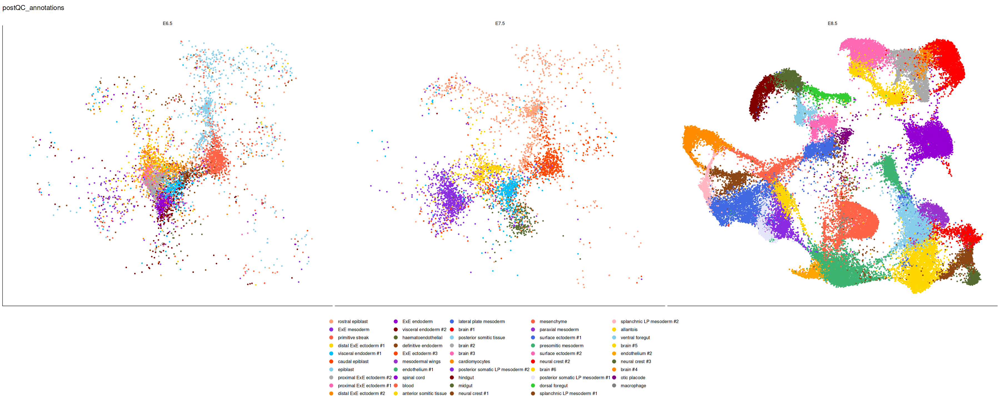

In [84]:
options(repr.plot.width=30, repr.plot.height=12)

pt_size <- 0.5
p4 <- DimPlot(seqFISH_postQC, 
              reduction = "umap",
              group.by = "postQC_annotations",
              split.by = "Estage",
              order = FALSE,
              raster = FALSE,
        pt.size = pt_size) +
      scale_color_manual(values = post_QC_celltype_colours) +
      theme_void() +
      coord_fixed() +
      theme(text = element_text(family = "Helvetica", size = 12),  # Set font family and size
            legend.position = "bottom",
            axis.line = element_line(color = "black",  size = 0.3))

p4

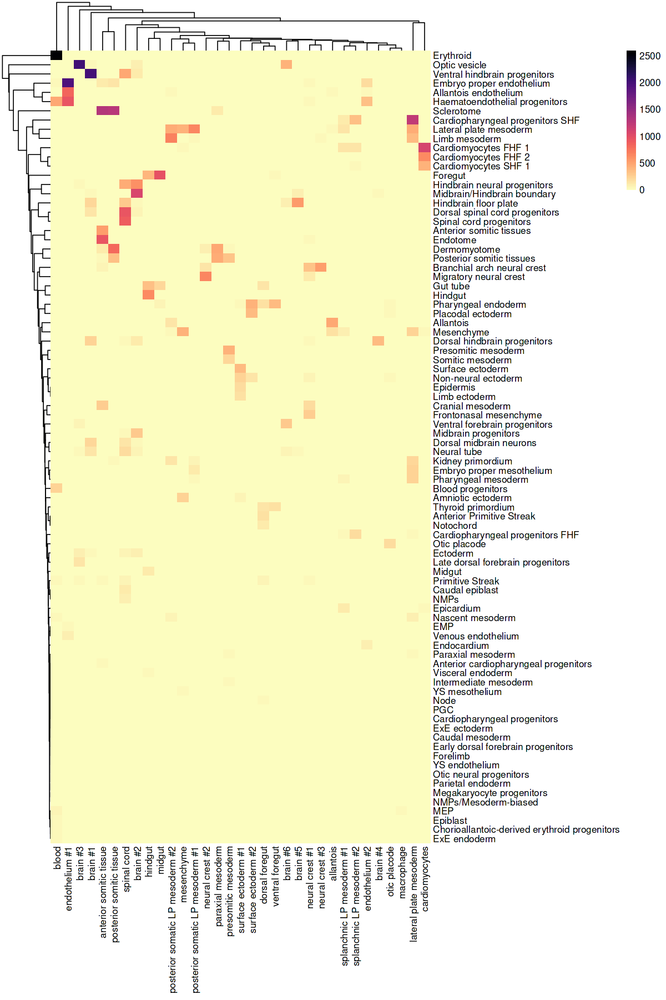

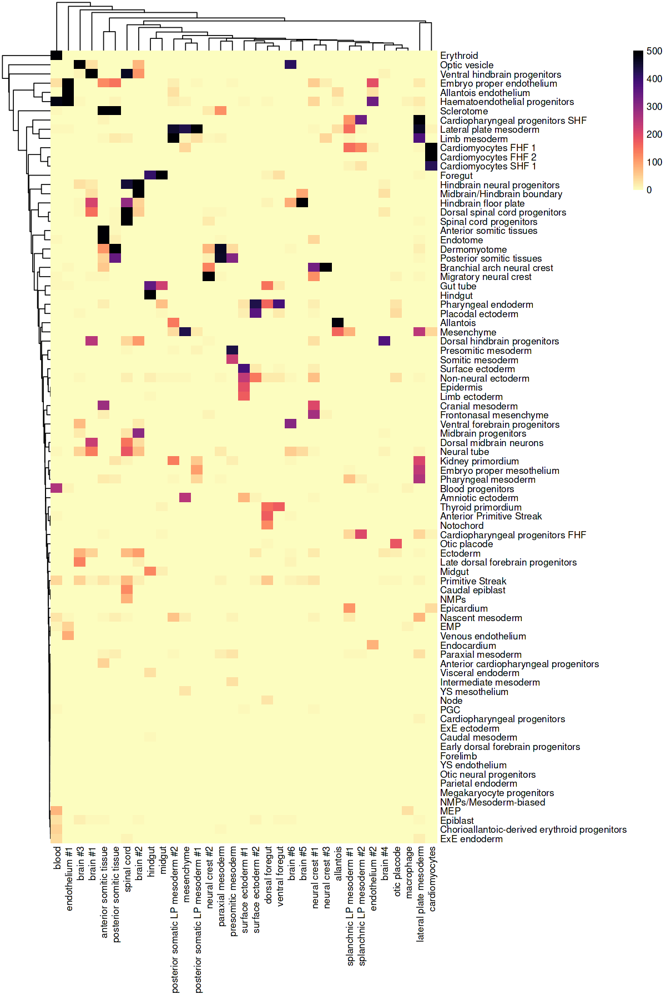

In [114]:
# Create the table of cell counts
cell_counts <- table(seqFISH_postQC_E8_ONLY@meta.data$celltype_extended_atlas, seqFISH_postQC_E8_ONLY@meta.data$postQC_annotations)

options(repr.plot.width=10, repr.plot.height=15)
# Create the heatmap with inverted plasma color scale and no cell borders
p1 <- pheatmap(cell_counts, color = rev(magma(100)), 
               border_color = NA,
               angle_col = 90,
               cluster_rows = TRUE,
               cluster_cols = TRUE,
               scale_row = TRUE,
               scale_col = TRUE)

# Define the maximum value for the scale
max_value <- 500  # Adjust this value as needed

# Define breaks for the heatmap scale, ensuring that it includes the maximum value
breaks <- seq(0, max_value, length.out = 101)

# Proceed with hierarchical clustering and adjust scale
p1 <- pheatmap(cell_counts, color = rev(magma(100)), 
               border_color = NA,
               angle_col = 90,
               cluster_rows = TRUE,
               cluster_cols = TRUE,
               scale_row = TRUE,
               scale_col = TRUE,
               breaks = breaks)


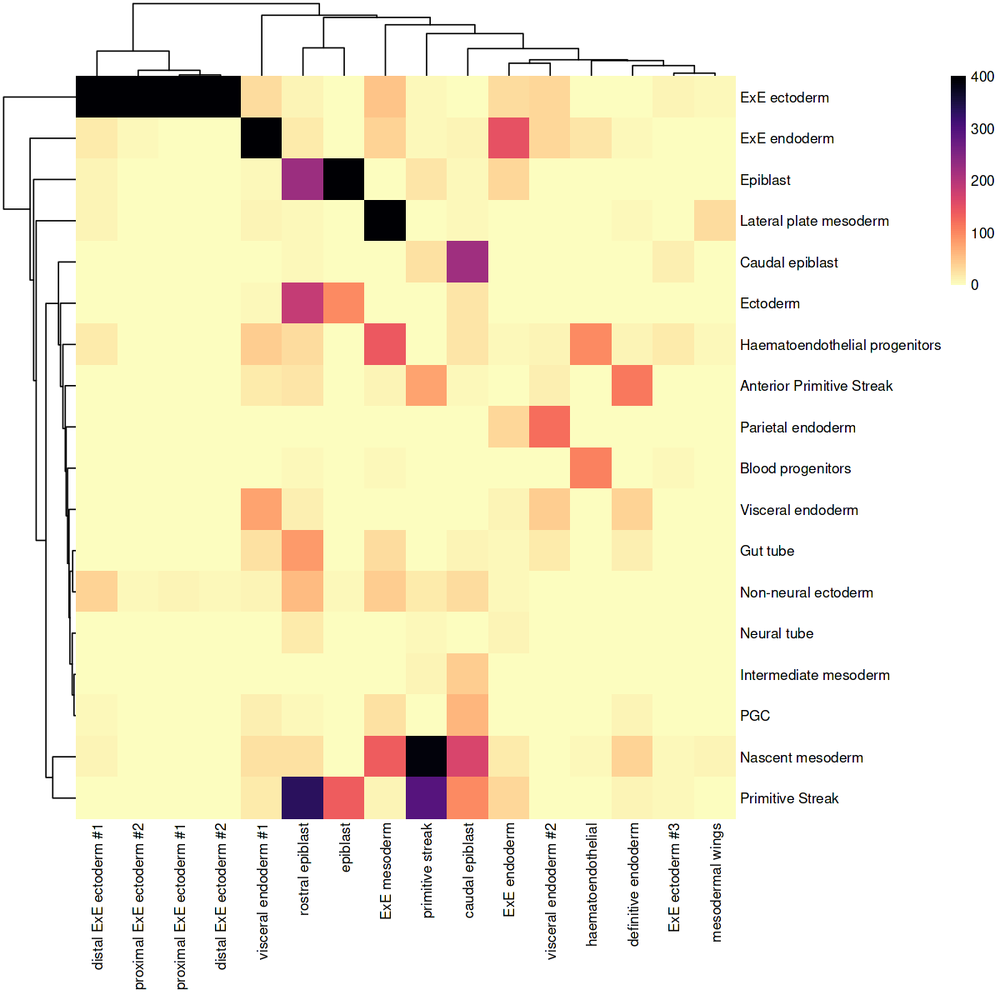

In [137]:
options(repr.plot.width=10, repr.plot.height=10)

# Generate table with cell type numbers
cell_counts <- table(post_QC_early_embryos_ONLY@meta.data$celltype_extended_atlas, 
                     post_QC_early_embryos_ONLY@meta.data$postQC_annotations)

# Compute row sums
row_sums <- rowSums(cell_counts)

# Define minimum count threshold
min_count <- 50

# Subset the table based on the sum condition
cell_counts_filtered <- cell_counts[row_sums >= min_count, ]

# Define the maximum value for the scale
max_value <- 400  # Adjust this value as needed

# Define breaks for the heatmap scale, ensuring that it includes the maximum value
breaks <- seq(0, max_value, length.out = 101)

# Proceed with hierarchical clustering and adjust scale
p1 <- pheatmap(cell_counts_filtered, color = rev(magma(100)), 
               border_color = NA,
               angle_col = 90,
               cluster_rows = TRUE,
               cluster_cols = TRUE,
               scale_row = TRUE,
               scale_col = TRUE,
               breaks = breaks)

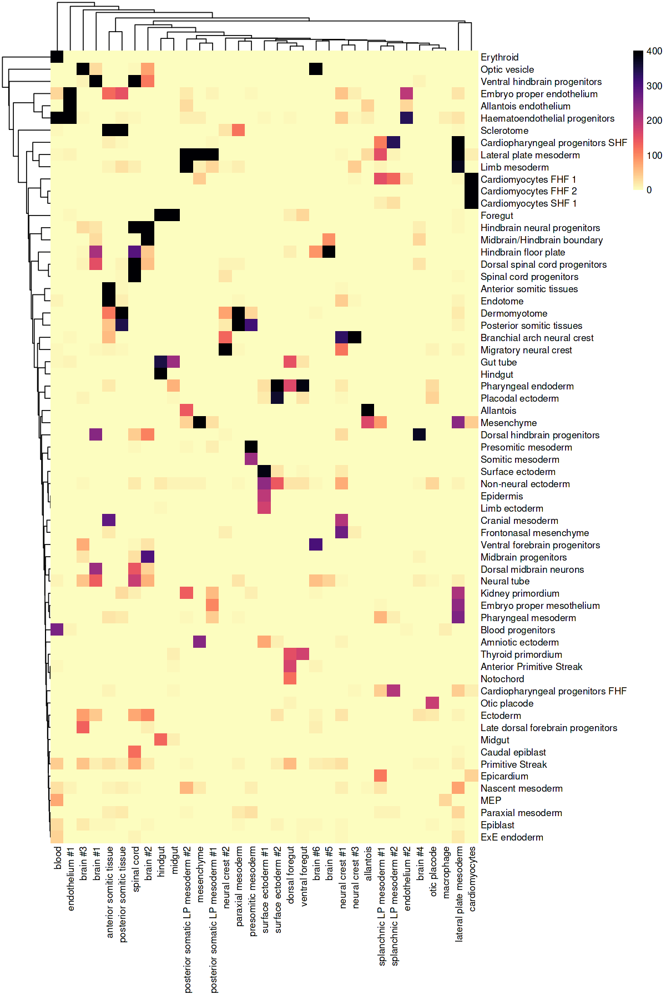

In [141]:
options(repr.plot.width=10, repr.plot.height=15)

cell_counts <- table(seqFISH_postQC_E8_ONLY@meta.data$celltype_extended_atlas,
                     seqFISH_postQC_E8_ONLY@meta.data$postQC_annotations)

# Compute row sums
row_sums <- rowSums(cell_counts)

# Define minimum count threshold
min_count <- 100

# Subset the table based on the sum condition
cell_counts_filtered <- cell_counts[row_sums >= min_count, ]

# Define the maximum value for the scale
max_value <- 400  # Adjust this value as needed

# Define breaks for the heatmap scale, ensuring that it includes the maximum value
breaks <- seq(0, max_value, length.out = 101)

# Proceed with hierarchical clustering and adjust scale
p1 <- pheatmap(cell_counts_filtered, color = rev(magma(100)), 
               border_color = NA,
               angle_col = 90,
               cluster_rows = TRUE,
               cluster_cols = TRUE,
               scale_row = TRUE,
               scale_col = TRUE,
               breaks = breaks)